#**Goat Vocals Classification Using Deep Learning Models**

#**MobileNet Training**



In [ ]:
import json
import numpy as np
import tensorflow as tf
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
import seaborn as sns
from google.colab import files
from google.colab import drive

#Access Google Drive
drive.mount('/content/gdrive/', force_remount=True)

Mounted at /content/gdrive/


In [ ]:
DATASET_LOGMELSPEC_PATH = "/content/gdrive/MyDrive/DATASET_AUDIO_PATTERN/data_for_mobileNet2.json"

In [ ]:
def load_data(dataset_logMelSpec_path):
  with open(dataset_logMelSpec_path, "r") as fp:
    data = json.load(fp)

  #create numpy array
  inputs = np.array(data['logMelSpec'])
  targets = np.array(data['labels'])
  mapping = np.array(data['mapping'])

  return inputs, targets, mapping

In [ ]:
def prepare_datasets(test_size, validation_size):
    # load data
    X, y, mapping = load_data(DATASET_LOGMELSPEC_PATH)

    # create train, validation and test split
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size)
    X_train, X_validation, y_train, y_validation = train_test_split(X_train, y_train, test_size=validation_size, stratify=y_train)

    # add an axis to input sets
    X_train = X_train[..., np.newaxis]
    X_validation = X_validation[..., np.newaxis]
    X_test = X_test[..., np.newaxis]

    return X_train, X_validation, X_test, y_train, y_validation, y_test, mapping

In [ ]:
import tensorflow as tf

def build_model(input_shape):
    # define input layer
    input_layer = tf.keras.layers.Input(shape=input_shape)  # Input shape is (128, 46, 1)

    # Resize and repeat the input image along the channel axis to create an RGB-like image
    resized_input = tf.image.resize(input_layer, (224, 224))  # Resize to (224, 224)
    repeated_input = tf.concat([resized_input] * 3, axis=-1)  # Repeat to have 3 channels

    # add base model
    base_model = tf.keras.applications.MobileNet(input_shape=(224, 224, 3), include_top=False, weights='imagenet')

    # Freeze the pretrained weights
    base_model.trainable = False

    x = base_model(repeated_input)

    # add global average pooling layer
    x = tf.keras.layers.GlobalAveragePooling2D()(x)

    # add dense layers
    x = tf.keras.layers.Dense(512, activation='relu')(x)
    x = tf.keras.layers.Dropout(0.3)(x)
    x = tf.keras.layers.Dense(512, activation='relu')(x)
    x = tf.keras.layers.Dropout(0.3)(x)
    output_layer = tf.keras.layers.Dense(8, activation='softmax')(x)

    # create and compile model
    model = tf.keras.Model(inputs=input_layer, outputs=output_layer)
    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001),
                  loss='sparse_categorical_crossentropy',
                  metrics=['accuracy'])
    return model


In [ ]:
def plot_history(history):
    fig, axs = plt.subplots(2)

    # create accuracy sublpot
    axs[0].plot(history.history["accuracy"], label="train accuracy")
    axs[0].plot(history.history["val_accuracy"], label="test accuracy")
    axs[0].set_ylabel("Accuracy")
    axs[0].legend(loc="lower right")
    axs[0].set_title("Accuracy eval")

    # create error sublpot
    axs[1].plot(history.history["loss"], label="train error")
    axs[1].plot(history.history["val_loss"], label="test error")
    axs[1].set_ylabel("Error")
    axs[1].set_xlabel("Epoch")
    axs[1].legend(loc="upper right")
    axs[1].set_title("Error eval")

    plt.show()

In [ ]:
def plotConfusionMatrix(y_test, y_pred, mapping):
    # Generate the confusion matrix
    cm = confusion_matrix(y_test, y_pred, normalize="true")

    plt.figure(figsize=(20, 20))

    # Plot the confusion matrix as a heatmap
    sns.heatmap(cm, annot=True, xticklabels=mapping, yticklabels=mapping)

    # Set the x-axis and y-axis labels
    plt.xlabel("Predicted class")
    plt.ylabel("True class")

    # Show the plot
    plt.show()

In [ ]:
# get train, validation, test splits
X_train, X_validation, X_test, y_train, y_validation, y_test, mapping = prepare_datasets(0.25, 0.2)


Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_3 (InputLayer)        [(None, 128, 44, 1)]         0         []                            
                                                                                                  
 tf.image.resize_1 (TFOpLam  (None, 224, 224, 1)          0         ['input_3[0][0]']             
 bda)                                                                                             
                                                                                                  
 tf.concat_1 (TFOpLambda)    (None, 224, 224, 3)          0         ['tf.image.resize_1[0][0]',   
                                                                     'tf.image.resize_1[0][0]',   
                                                                     'tf.image.resize_1[0][0

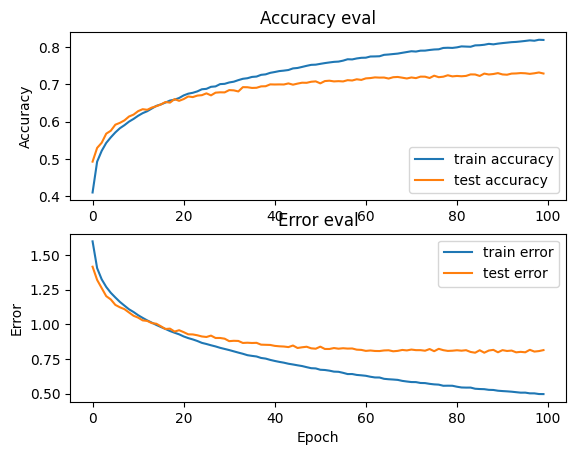

In [ ]:
# create network
input_shape = (X_train.shape[1], X_train.shape[2], 1)
model = build_model(input_shape)

# compile model
optimiser = tf.keras.optimizers.Adam(learning_rate=0.0001)
model.compile(optimizer=optimiser,
            loss='sparse_categorical_crossentropy',
            metrics=['accuracy'])

model.summary()

# train model
history = model.fit(X_train, y_train, validation_data=(X_validation, y_validation), batch_size=64, epochs=100)

# plot accuracy/error for training and validation
plot_history(history)

In [ ]:
#save model
import tensorflow as tf

# Replace 'my_model' with your model variable name
tf.saved_model.save(model, '/content/gdrive/MyDrive/DATASET_AUDIO_PATTERN/mobNet_vocapra_model')

computing y_pred
1505/1505 [==============================] - 9s 6ms/step


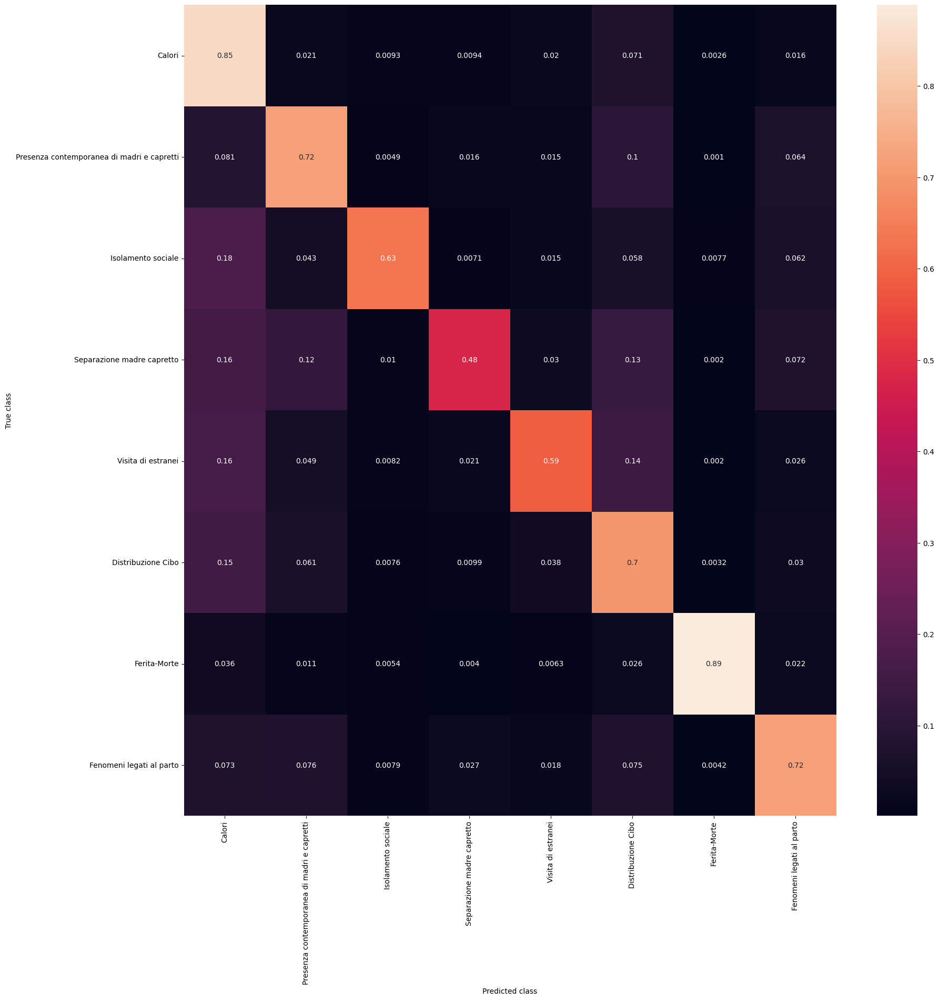

1505/1505 - 10s - loss: 0.8273 - accuracy: 0.7266 - 10s/epoch - 6ms/step

Test accuracy: 0.7266402244567871


In [ ]:
# generate predictions for test set
print("computing y_pred")
y_pred = np.argmax(model.predict(X_test), axis=1)

# plot confusion matrix
plotConfusionMatrix(y_test, y_pred, mapping)

# evaluate model on test set
test_loss, test_acc = model.evaluate(X_test, y_test, verbose=2)
print('\nTest accuracy:', test_acc)

# **Custom CNN**

In [ ]:
import json
import numpy as np
import tensorflow as tf
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
import seaborn as sns
import os
from sklearn.model_selection import KFold
import h5py
from google.colab import files
from google.colab import drive

#Access Google Drive
drive.mount('/content/gdrive/', force_remount=True)

Mounted at /content/gdrive/


In [ ]:
DATASET_LOGMELSPEC_PATH = "/content/gdrive/MyDrive/DATASET_AUDIO_PATTERN/data_custom_CNN.h5"

In [ ]:
def load_data(dataset_logMelSpec_path):
    with h5py.File(dataset_logMelSpec_path, "r") as fp:
        inputs = fp["logMelSpec"][:]
        targets = fp["labels"][:]


    return inputs, targets


In [ ]:
def plot_history(history, save_path):
    fig, axs = plt.subplots(2)

    # create accuracy sublpot
    axs[0].plot(history.history["accuracy"], label="train accuracy")
    axs[0].plot(history.history["val_accuracy"], label="test accuracy")
    axs[0].set_ylabel("Accuracy")
    axs[0].legend(loc="lower right")
    axs[0].set_title("Accuracy eval")

    # create error sublpot
    axs[1].plot(history.history["loss"], label="train error")
    axs[1].plot(history.history["val_loss"], label="test error")
    axs[1].set_ylabel("Error")
    axs[1].set_xlabel("Epoch")
    axs[1].legend(loc="upper right")
    axs[1].set_title("Error eval")

    # Save the plot as a PNG image
    plt.savefig(save_path, dpi=300, bbox_inches='tight')

In [ ]:
def prepare_datasets(k_folds):
    # load data
    X, y = load_data(DATASET_LOGMELSPEC_PATH)

    # add an axis to input sets
    X = X[..., np.newaxis]

    # create K-fold splits
    kfold = KFold(n_splits=k_folds, shuffle=True, random_state=42)
    splits = kfold.split(X, y)

    # return generator that yields the train, validation, and test splits
    for train_idx, test_idx in splits:
        X_train, X_test = X[train_idx], X[test_idx]
        y_train, y_test = y[train_idx], y[test_idx]

        # perform stratified sampling on the train set to create a validation set
        X_train, X_validation, y_train, y_validation = train_test_split(X_train, y_train, test_size=0.2, stratify=y_train)

        yield X_train, X_validation, X_test, y_train, y_validation, y_test

In [ ]:
def build_model(input_shape):
    model = tf.keras.Sequential()

    # block 1
    model.add(tf.keras.layers.Conv2D(64, (3, 3), activation='relu', padding='same', input_shape=input_shape))
    model.add(tf.keras.layers.Conv2D(64, (3, 3), activation='relu', padding='same'))
    model.add(tf.keras.layers.MaxPooling2D((2, 2), strides=(2, 2)))

    # block 2
    model.add(tf.keras.layers.Conv2D(128, (3, 3), activation='relu', padding='same'))
    model.add(tf.keras.layers.Conv2D(128, (3, 3), activation='relu', padding='same'))
    model.add(tf.keras.layers.MaxPooling2D((2, 2), strides=(2, 2)))

    # block 3
    model.add(tf.keras.layers.Conv2D(256, (3, 3), activation='relu', padding='same'))
    model.add(tf.keras.layers.Conv2D(256, (3, 3), activation='relu', padding='same'))
    model.add(tf.keras.layers.MaxPooling2D((2, 2), strides=(2, 2)))

    # block 4
    model.add(tf.keras.layers.Conv2D(512, (3, 3), activation='relu', padding='same'))
    model.add(tf.keras.layers.Conv2D(512, (3, 3), activation='relu', padding='same'))
    model.add(tf.keras.layers.MaxPooling2D((2, 2), strides=(2, 2)))

    # flatten and dense layers
    model.add(tf.keras.layers.Flatten())
    model.add(tf.keras.layers.Dense(4096, activation='relu'))
    model.add(tf.keras.layers.Dropout(0.5))
    model.add(tf.keras.layers.Dense(4096, activation='relu'))

    # output layer
    model.add(tf.keras.layers.Dense(8, activation='softmax'))

    return model

In [ ]:
def plotConfusionMatrix(y_test, y_pred, save_path):
    # Get the mapping
    mapping = [
        "Calori",
        "Presenza Contemporanea di madri e capretti",
        "Isolamento sociale",
        "Separazione madre capretto",
        "Visita di estranei",
        "Distribuzione Cibo",
        "Ferita-Morte",
        "Fenomeni legati al parto"
    ]

    # Generate the confusion matrix
    cm = confusion_matrix(y_test, y_pred, normalize="true")

    plt.figure(figsize=(20, 20))

    # Plot the confusion matrix as a heatmap
    sns.heatmap(cm, annot=True, xticklabels=mapping, yticklabels=mapping)

    # Set the x-axis and y-axis labels
    plt.xlabel("Predicted class")
    plt.ylabel("True class")

    # Save the plot as a PNG image
    plt.savefig(save_path, dpi=300, bbox_inches='tight')

Training fold 1...
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 128, 44, 64)       640       
                                                                 
 conv2d_1 (Conv2D)           (None, 128, 44, 64)       36928     
                                                                 
 max_pooling2d (MaxPooling2  (None, 64, 22, 64)        0         
 D)                                                              
                                                                 
 conv2d_2 (Conv2D)           (None, 64, 22, 128)       73856     
                                                                 
 conv2d_3 (Conv2D)           (None, 64, 22, 128)       147584    
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 32, 11, 128)       0         
 g2D)                                

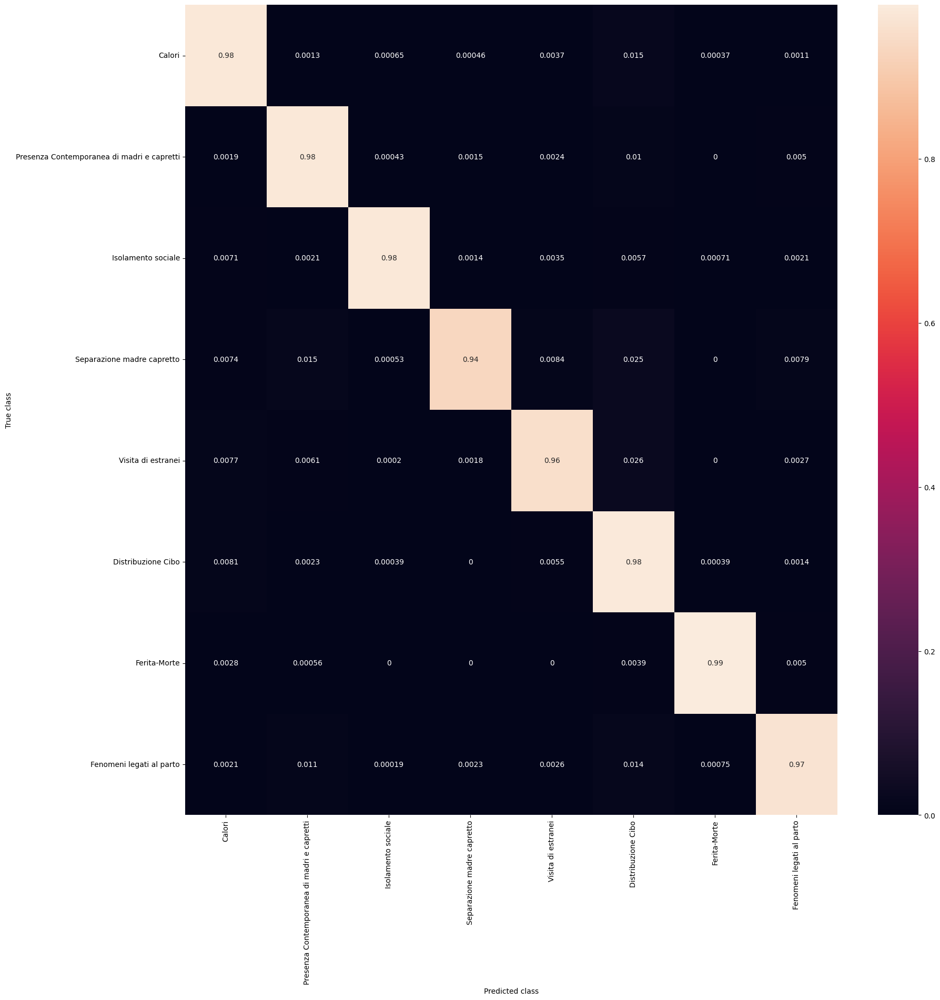

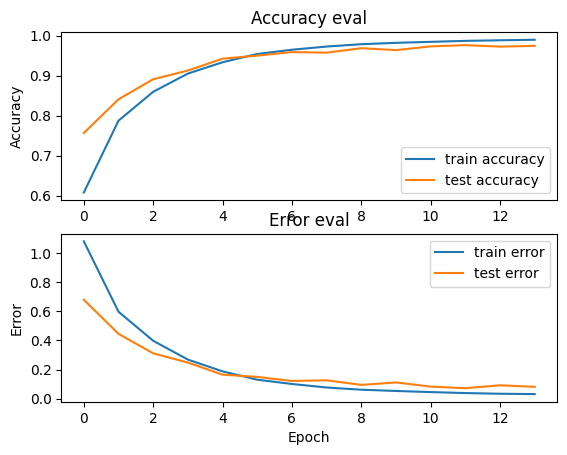

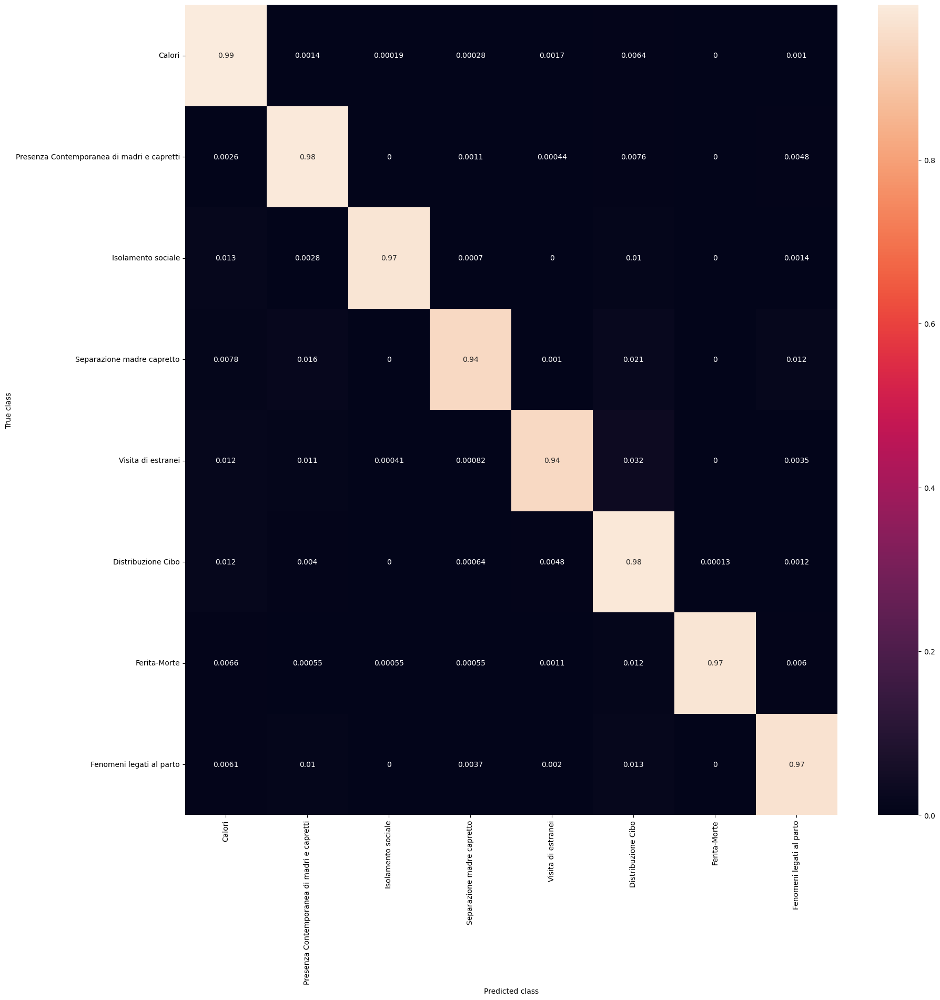

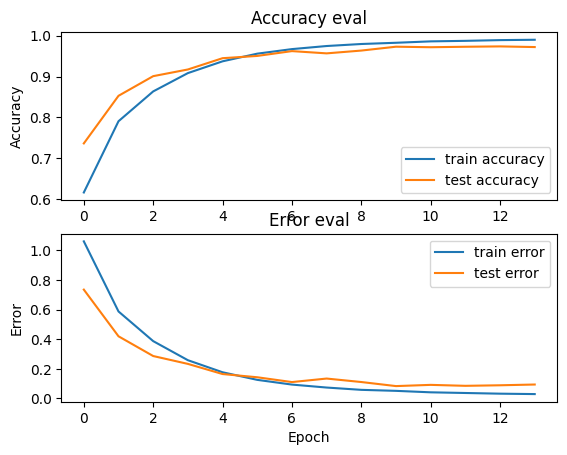

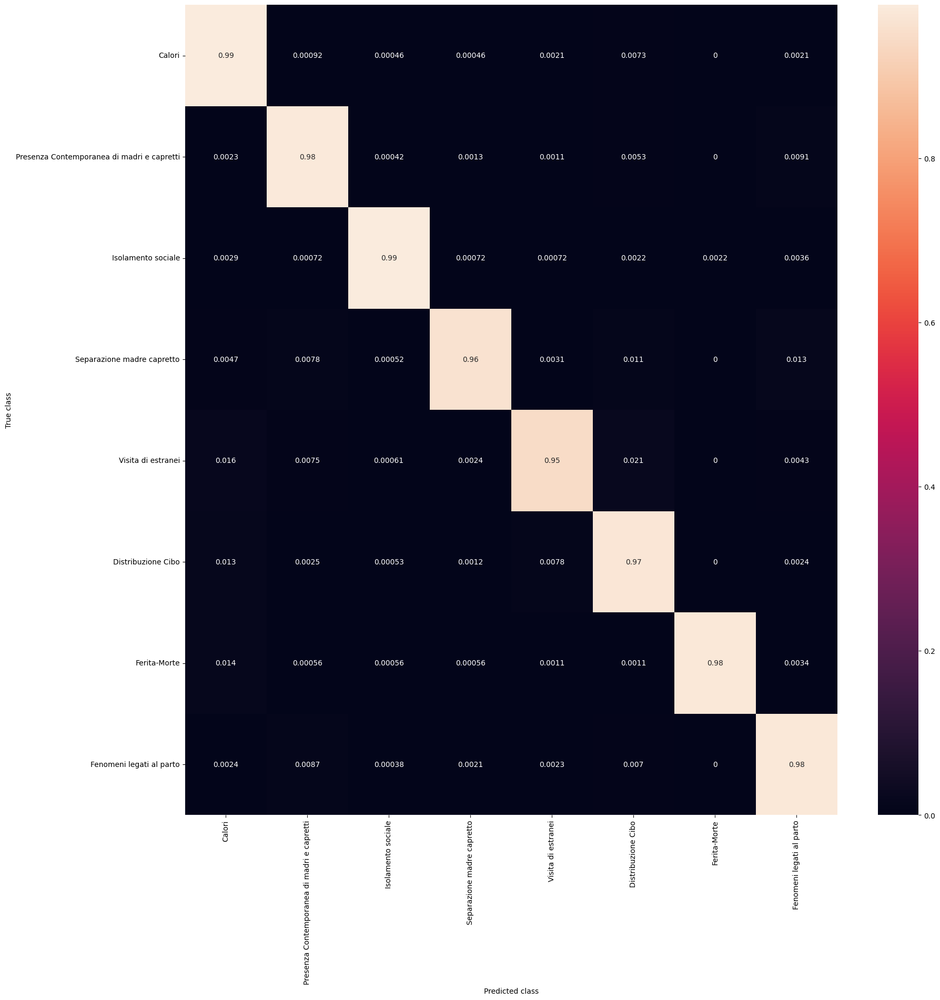

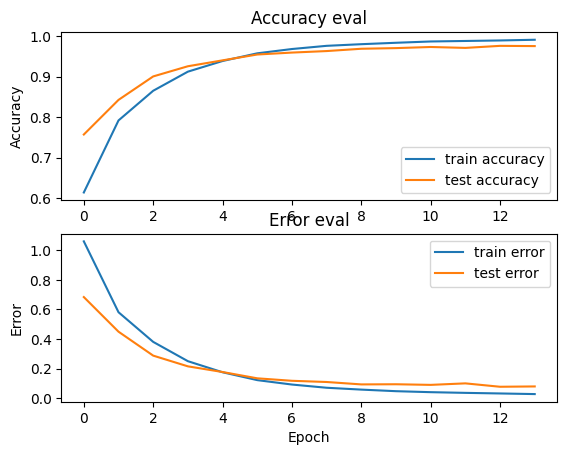

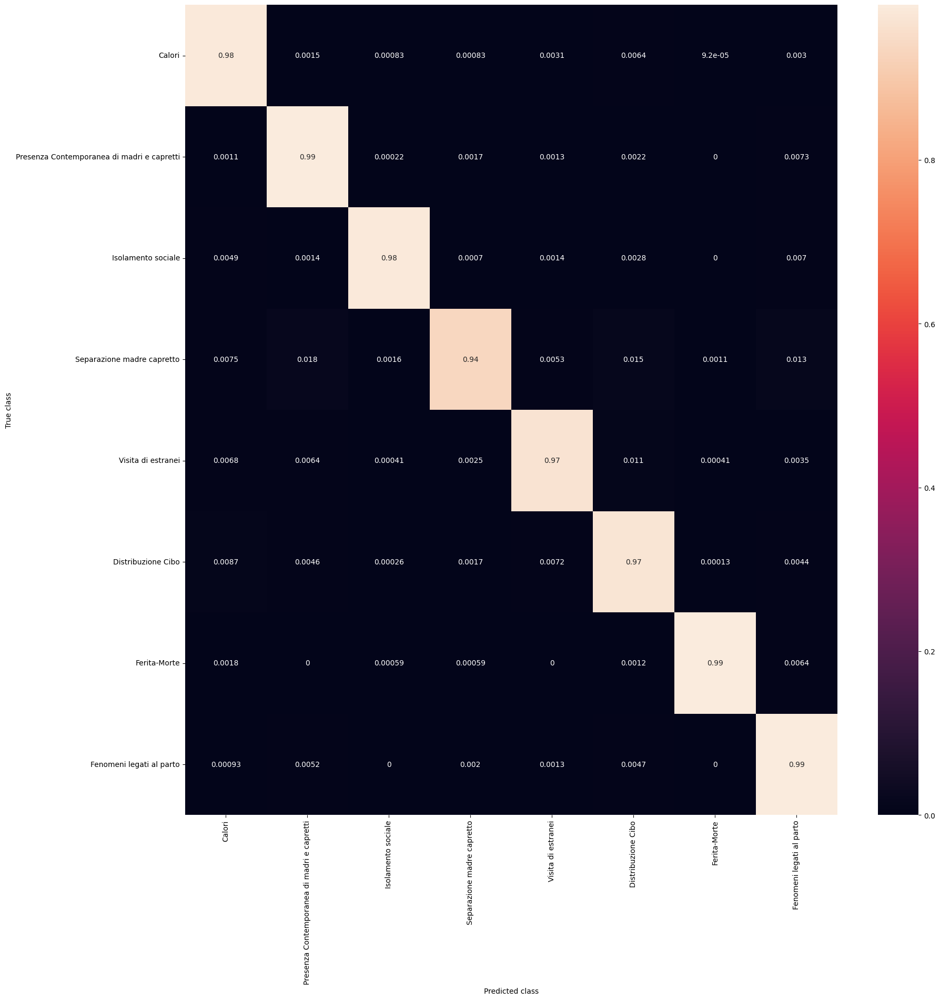

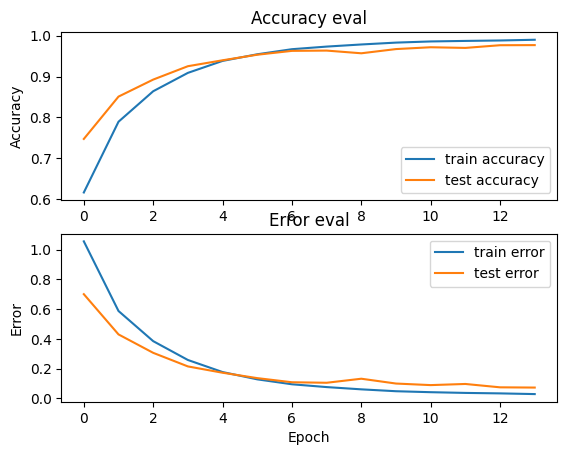

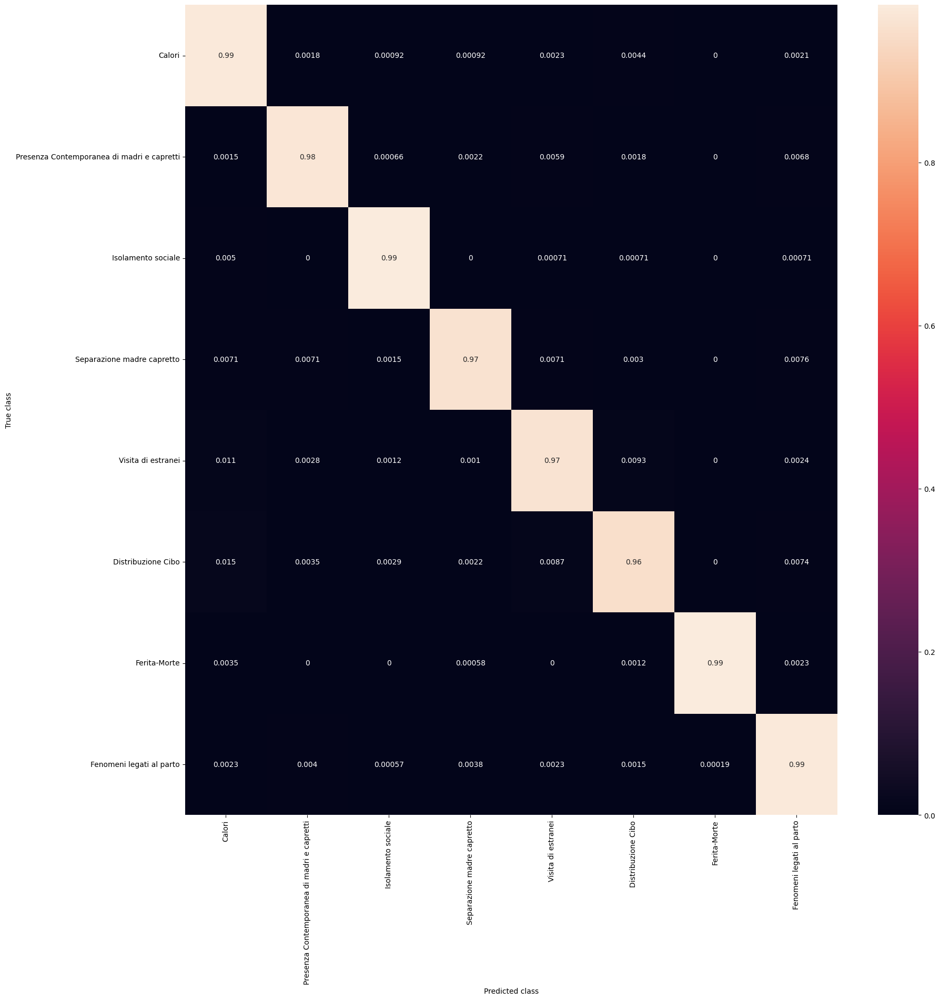

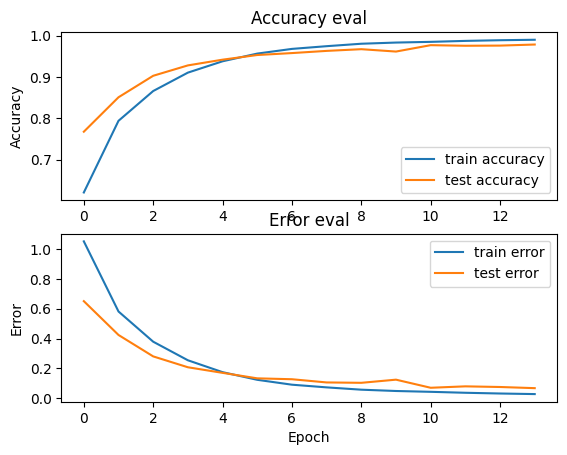

In [ ]:
k_folds = 5
# train model
for i, (X_train, X_validation, X_test, y_train, y_validation, y_test) in enumerate(prepare_datasets(k_folds)):
    print(f"Training fold {i+1}...")

    # create new model instance for each fold
    model = build_model((128, 44, 1))

    # compile model
    optimiser = tf.keras.optimizers.Adam(learning_rate=0.00001)
    model.compile(optimizer=optimiser,
                loss='sparse_categorical_crossentropy',
                metrics=['accuracy'])

    model.summary()

    # train the model on this fold
    history = model.fit(X_train, y_train, validation_data=(X_validation, y_validation), batch_size=12, epochs=14)

    if i == 1:
      # save model
      tf.saved_model.save(model, '/content/gdrive/MyDrive/DATASET_AUDIO_PATTERN/customCNN_vocapra_model')

    # evaluate the model on the test set for this fold
    test_loss, test_acc = model.evaluate(X_test, y_test)
    print(f"Fold {i+1} test loss: {test_loss:.4f}")
    print(f"Fold {i+1} test accuracy: {test_acc:.4f}")

    # generate predictions on the test set for this fold
    y_pred = np.argmax(model.predict(X_test), axis=-1)

    # define the plots names
    imageNameMatrix = "Fold_" + str(i) + "_confusionMatrix.png"
    imageNameHistory = "Fold_" + str(i) + "_history.png"

    #path for saving the images
    gDriveMatrixPath = '/content/gdrive/MyDrive/DATASET_AUDIO_PATTERN/imageNameMatrix'
    gDriveHistoryPath = '/content/gdrive/MyDrive/DATASET_AUDIO_PATTERN/imageNameHistory'

    # plot confusion matrix for this fold
    plotConfusionMatrix(y_test, y_pred, gDriveMatrixPath)

    # plot the training history for the final fold
    plot_history(history, gDriveHistoryPath)

# **EfficientNetB0**

In [ ]:
import json
import numpy as np
import tensorflow as tf
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
import seaborn as sns
from google.colab import files
from google.colab import drive

#Access Google Drive
drive.mount('/content/gdrive/', force_remount=True)

Mounted at /content/gdrive/


In [ ]:
DATASET_LOGMELSPEC_PATH = "/content/gdrive/MyDrive/DATASET_AUDIO_PATTERN/data_for_mobileNet2.json"

In [ ]:
def load_data(dataset_logMelSpec_path):
  with open(dataset_logMelSpec_path, "r") as fp:
    data = json.load(fp)

  #create numpy array
  inputs = np.array(data['logMelSpec'])
  targets = np.array(data['labels'])
  mapping = np.array(data['mapping'])

  return inputs, targets, mapping

In [ ]:
def prepare_datasets(test_size, validation_size):
    # load data
    X, y, mapping = load_data(DATASET_LOGMELSPEC_PATH)

    # create train, validation and test split
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size)
    X_train, X_validation, y_train, y_validation = train_test_split(X_train, y_train, test_size=validation_size, stratify=y_train)

    # add an axis to input sets
    X_train = X_train[..., np.newaxis]
    X_validation = X_validation[..., np.newaxis]
    X_test = X_test[..., np.newaxis]

    return X_train, X_validation, X_test, y_train, y_validation, y_test, mapping

In [ ]:
import tensorflow as tf

def build_model(input_shape):
    # define input layer
    input_layer = tf.keras.layers.Input(shape=input_shape)  # Input shape is (128, 46, 1)

    # Resize and repeat the input image along the channel axis to create an RGB-like image
    resized_input = tf.image.resize(input_layer, (224, 224))  # Resize to (224, 224)
    repeated_input = tf.concat([resized_input] * 3, axis=-1)  # Repeat to have 3 channels

    # add base model
    base_model = tf.keras.applications.MobileNet(input_shape=(224, 224, 3), include_top=False, weights='imagenet')

    # Freeze the pretrained weights
    base_model.trainable = False

    x = base_model(repeated_input)

    # add global average pooling layer
    x = tf.keras.layers.GlobalAveragePooling2D()(x)

    # add dense layers
    x = tf.keras.layers.Dense(4096, activation='relu')(x)
    x = tf.keras.layers.Dropout(0.3)(x)
    x = tf.keras.layers.Dense(4096, activation='relu')(x)
    x = tf.keras.layers.Dropout(0.3)(x)
    output_layer = tf.keras.layers.Dense(8, activation='softmax')(x)

    # create and compile model
    model = tf.keras.Model(inputs=input_layer, outputs=output_layer)
    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001),
                  loss='sparse_categorical_crossentropy',
                  metrics=['accuracy'])
    return model

In [ ]:
def plot_history(history):
    fig, axs = plt.subplots(2)

    # create accuracy sublpot
    axs[0].plot(history.history["accuracy"], label="train accuracy")
    axs[0].plot(history.history["val_accuracy"], label="test accuracy")
    axs[0].set_ylabel("Accuracy")
    axs[0].legend(loc="lower right")
    axs[0].set_title("Accuracy eval")

    # create error sublpot
    axs[1].plot(history.history["loss"], label="train error")
    axs[1].plot(history.history["val_loss"], label="test error")
    axs[1].set_ylabel("Error")
    axs[1].set_xlabel("Epoch")
    axs[1].legend(loc="upper right")
    axs[1].set_title("Error eval")

    plt.show()

In [ ]:
def plotConfusionMatrix(y_test, y_pred, mapping):
    # Generate the confusion matrix
    cm = confusion_matrix(y_test, y_pred, normalize="true")

    plt.figure(figsize=(20, 20))

    # Plot the confusion matrix as a heatmap
    sns.heatmap(cm, annot=True, xticklabels=mapping, yticklabels=mapping)

    # Set the x-axis and y-axis labels
    plt.xlabel("Predicted class")
    plt.ylabel("True class")

    # Show the plot
    plt.show()

In [ ]:
# get train, validation, test splits
X_train, X_validation, X_test, y_train, y_validation, y_test, mapping = prepare_datasets(0.25, 0.2)

Model: "model_4"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_9 (InputLayer)        [(None, 128, 44, 1)]         0         []                            
                                                                                                  
 tf.image.resize_4 (TFOpLam  (None, 224, 224, 1)          0         ['input_9[0][0]']             
 bda)                                                                                             
                                                                                                  
 tf.concat_4 (TFOpLambda)    (None, 224, 224, 3)          0         ['tf.image.resize_4[0][0]',   
                                                                     'tf.image.resize_4[0][0]',   
                                                                     'tf.image.resize_4[0][0

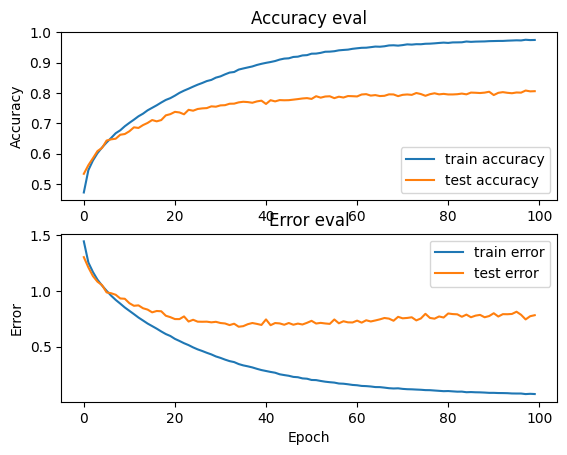

In [ ]:
# create network
input_shape = (X_train.shape[1], X_train.shape[2], 1)
model = build_model(input_shape)

# compile model
optimiser = tf.keras.optimizers.Adam(learning_rate=0.0001)
model.compile(optimizer=optimiser,
            loss='sparse_categorical_crossentropy',
            metrics=['accuracy'])

model.summary()

# train model
history = model.fit(X_train, y_train, validation_data=(X_validation, y_validation), batch_size=64, epochs=100)

# plot accuracy/error for training and validation
plot_history(history)

In [ ]:
#save model
import tensorflow as tf

# Replace 'my_model' with your model variable name
tf.saved_model.save(model, '/content/gdrive/MyDrive/DATASET_AUDIO_PATTERN/EffNetB0_vocapra_model')

computing y_pred
1505/1505 [==============================] - 9s 6ms/step


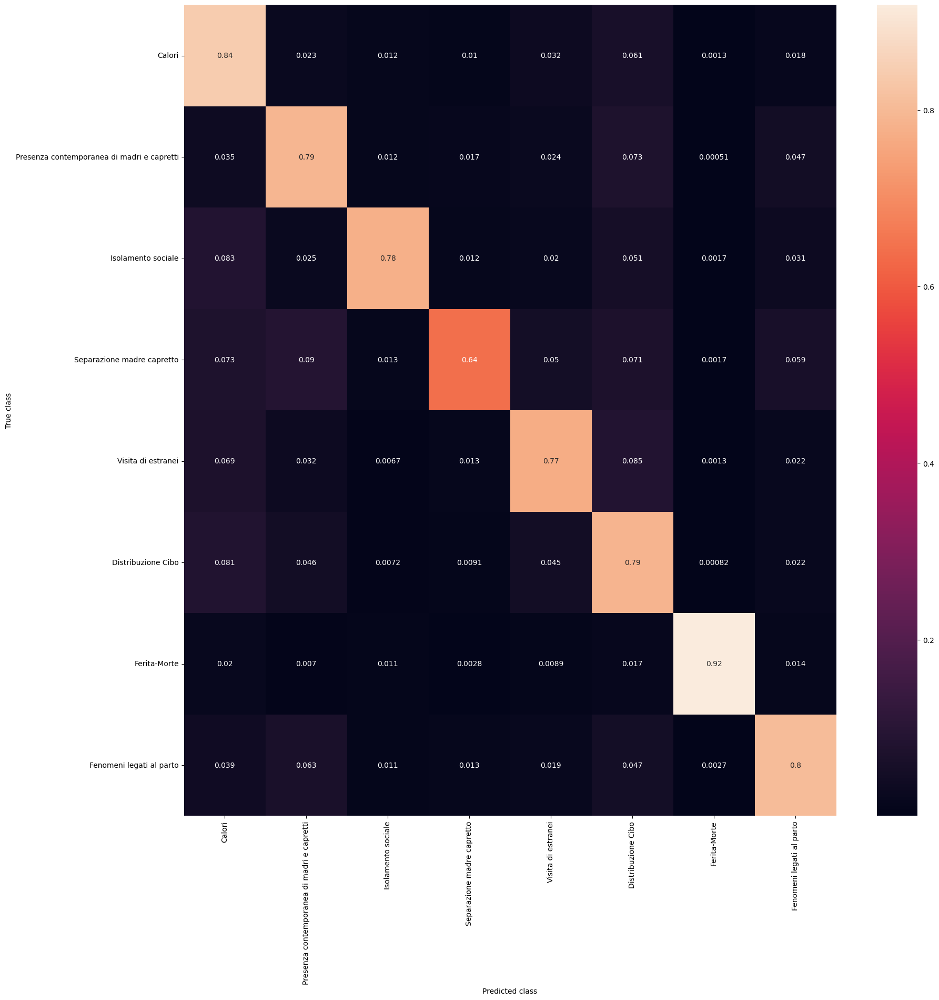

1505/1505 - 10s - loss: 0.7865 - accuracy: 0.8024 - 10s/epoch - 6ms/step

Test accuracy: 0.8024258017539978


In [ ]:
# generate predictions for test set
print("computing y_pred")
y_pred = np.argmax(model.predict(X_test), axis=1)

# plot confusion matrix
plotConfusionMatrix(y_test, y_pred, mapping)

# evaluate model on test set
test_loss, test_acc = model.evaluate(X_test, y_test, verbose=2)
print('\nTest accuracy:', test_acc)

#**EXPLAINABILITY: LRP**

In [ ]:
!pip install innvestigate

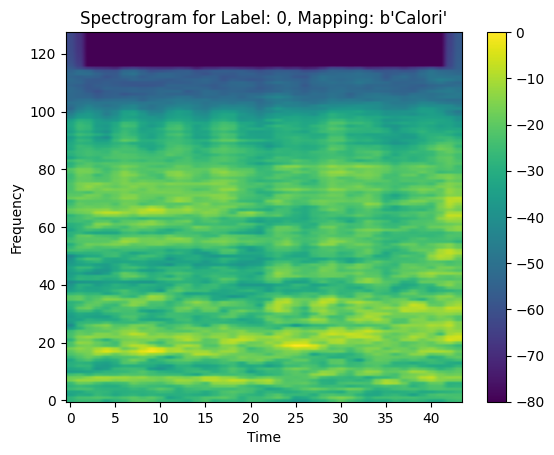

In [ ]:
import h5py
import matplotlib.pyplot as plt

with h5py.File("/content/gdrive/MyDrive/DATASET_AUDIO_PATTERN/TEST_CUSTOMCNN.h5", "r") as fp:
    spectrograms = fp['logMelSpec'][0]
    labels = fp["labels"][0]
    mapping = fp["mapping"][0]

# Define the desired shape for individual spectrograms
desired_shape = (1, 128, 44, 1)

# Reshape the spectrogram to the desired shape
spectrogram = spectrograms.reshape(desired_shape)

# Get the time and frequency dimensions
time = range(spectrogram.shape[1])
frequency = range(spectrogram.shape[2])

# Plot the log-mel spectrogram
plt.imshow(spectrogram[0, :, :, 0], origin='lower', aspect='auto', cmap='viridis')
plt.xlabel('Time')
plt.ylabel('Frequency')
plt.title(f'Spectrogram for Label: {labels}, Mapping: {mapping}')
plt.colorbar()
plt.show()


In [ ]:
import h5py
import tensorflow as tf
import cv2
import matplotlib.pyplot as plt
import numpy as np
import innvestigate
from PIL import Image

# Disable eager execution
tf.compat.v1.disable_eager_execution()

model = tf.keras.Sequential()

# block 1
model.add(tf.keras.layers.Conv2D(64, (3, 3), activation='relu', padding='same', input_shape=(128, 44, 1)))
model.add(tf.keras.layers.Conv2D(64, (3, 3), activation='relu', padding='same'))
model.add(tf.keras.layers.MaxPooling2D((2, 2), strides=(2, 2)))

# block 2
model.add(tf.keras.layers.Conv2D(128, (3, 3), activation='relu', padding='same'))
model.add(tf.keras.layers.Conv2D(128, (3, 3), activation='relu', padding='same'))
model.add(tf.keras.layers.MaxPooling2D((2, 2), strides=(2, 2)))

# block 3
model.add(tf.keras.layers.Conv2D(256, (3, 3), activation='relu', padding='same'))
model.add(tf.keras.layers.Conv2D(256, (3, 3), activation='relu', padding='same'))
model.add(tf.keras.layers.MaxPooling2D((2, 2), strides=(2, 2)))

# block 4
model.add(tf.keras.layers.Conv2D(512, (3, 3), activation='relu', padding='same'))
model.add(tf.keras.layers.Conv2D(512, (3, 3), activation='relu', padding='same'))
model.add(tf.keras.layers.MaxPooling2D((2, 2), strides=(2, 2)))

# flatten and dense layers
model.add(tf.keras.layers.Flatten())
model.add(tf.keras.layers.Dense(4096, activation='relu'))
model.add(tf.keras.layers.Dropout(0.5))
model.add(tf.keras.layers.Dense(4096, activation='relu'))

# output layer
model.add(tf.keras.layers.Dense(8, activation='softmax'))

model.load_weights('/content/gdrive/MyDrive/DATASET_AUDIO_PATTERN/customCNN_vocapra_model')

model.summary()





Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_24 (Conv2D)          (None, 128, 44, 64)       640       
                                                                 
 conv2d_25 (Conv2D)          (None, 128, 44, 64)       36928     
                                                                 
 max_pooling2d_12 (MaxPooli  (None, 64, 22, 64)        0         
 ng2D)                                                           
                                                                 
 conv2d_26 (Conv2D)          (None, 64, 22, 128)       73856     
                                                                 
 conv2d_27 (Conv2D)          (None, 64, 22, 128)       147584    
                                                                 
 max_pooling2d_13 (MaxPooli  (None, 32, 11, 128)       0         
 ng2D)                                                

yes
yes
yes
yes
yes


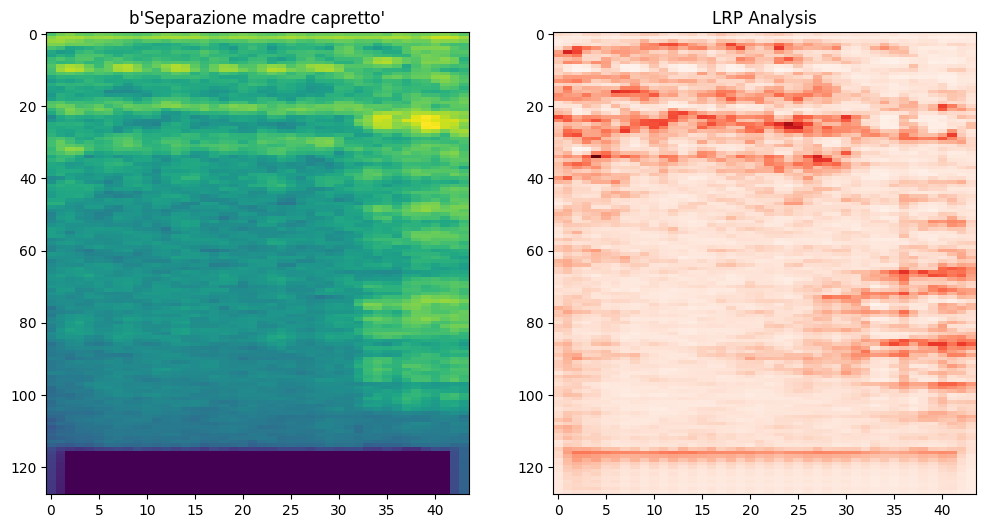

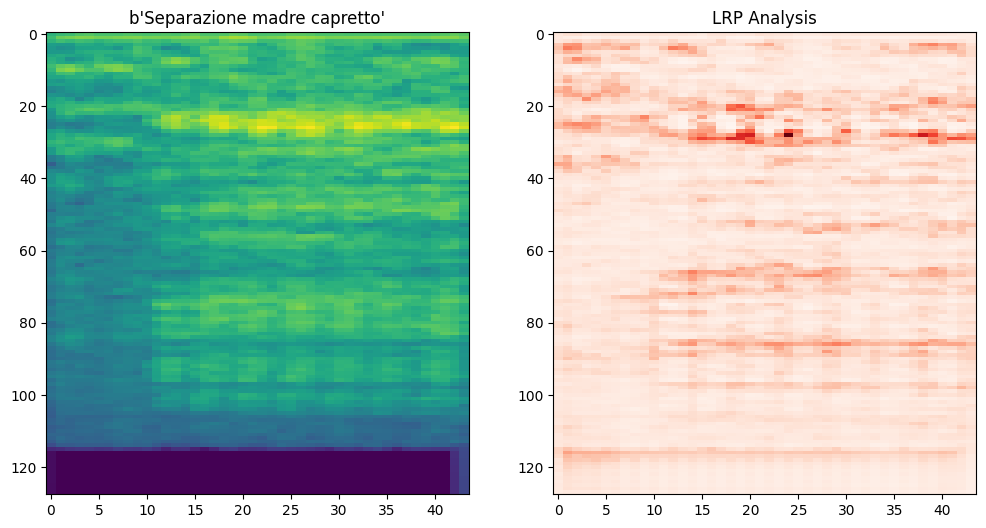

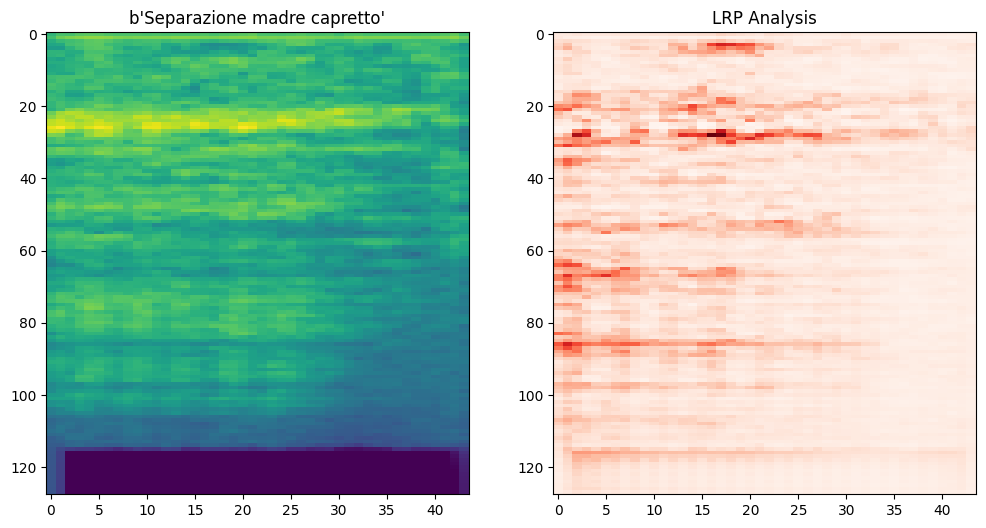

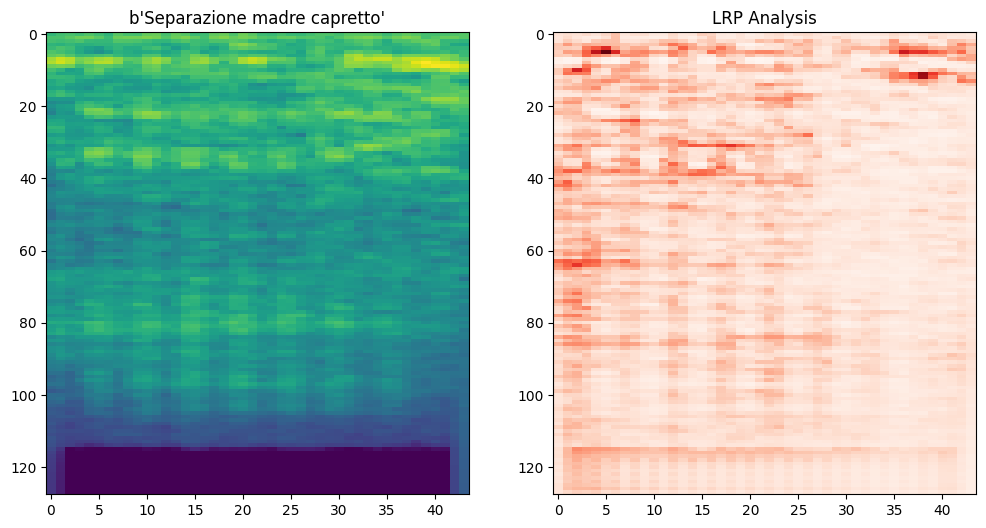

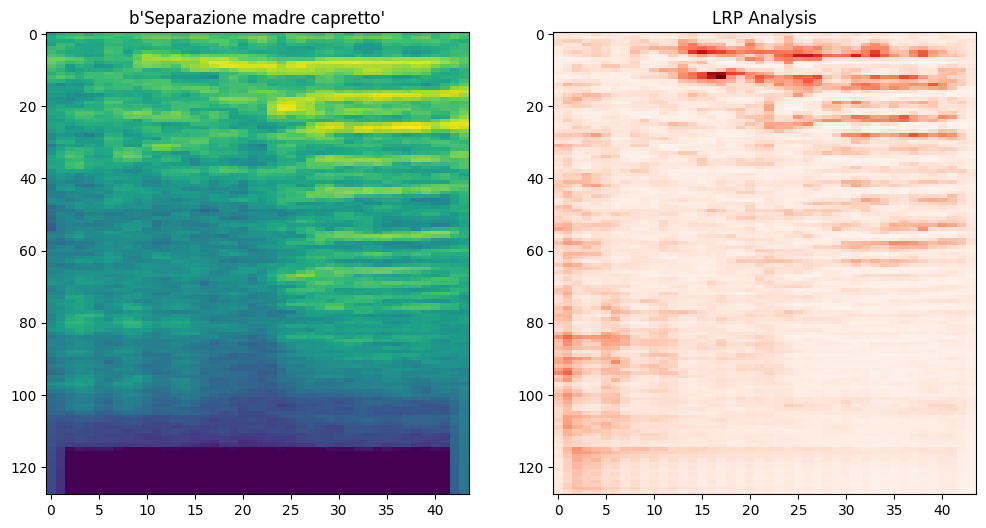

In [ ]:
import os
# Create a modified model without the softmax activation in the output layer
model_without_softmax = tf.keras.Sequential(model.layers[:-1])

desired_shape = (1, 128, 44, 1)

low_value=0
high_value = 1

# Create an analyzer for your model
analyzer = innvestigate.create_analyzer("deep_taylor.bounded", model_without_softmax,  low=low_value, high=high_value)
analyzer2 = innvestigate.create_analyzer("lrp.z.bounded")

# Initialize a dictionary to keep track of the saved figures for each label
saved_figures_count = {}

# Define the maximum number of figures to save for each label
max_figures_per_label = 2

count = 0

for i, logMelSpec in enumerate(spectrograms):

        label = labels[i]


        if mapping[label] == mapping[0]:

            count = count+1

            print("yes")

            # Check if the label is already in the dictionary, if not, initialize the count
            if label not in saved_figures_count:
                saved_figures_count[label] = 0

            # Check if we have saved the maximum number of figures for the current label
            if saved_figures_count[label] >= max_figures_per_label:
                continue  # Skip saving more figures for this label

            logMelSpec = logMelSpec.reshape(desired_shape).astype(np.float32)

            # Analyze the logMelSpec
            analysis = analyzer.analyze(logMelSpec)
            analysis2 = analyzer2.analyze(logMelSpec)

            # Apply thresholding and normalization for readability
            threshold = 0.2  # Adjust the threshold as needed

            # Apply thresholding and normalization for readability
            analysis[analysis < -threshold] = -threshold
            analysis[analysis > threshold] = threshold
            analysis = (analysis - analysis.min()) / (analysis.max() - analysis.min())

            # Apply thresholding and normalization for readability
            analysis2[analysis2 < -threshold] = -threshold
            analysis2[analysis2 > threshold] = threshold
            analysis2 = (analysis2 - analysis2.min()) / (analysis2.max() - analysis2.min())

            # Display the original log-mel spectrogram and LRP analysis side by side
            fig, axes = plt.subplots(1, 2, figsize=(12, 6))

            # Display the original log-mel spectrogram
            axes[0].imshow(np.squeeze(logMelSpec), cmap='viridis', aspect='auto')
            axes[0].set_title(mapping[labels[i]])

            # Display the LRP analysis
            axes[1].imshow(analysis[0], cmap='Reds', aspect='auto')
            axes[1].set_title('DeepTaylor')

            path = "/content/gdrive/MyDrive/DATASET_AUDIO_PATTERN/lrpImages"

            # Generate a unique filename for each image based on 'i'
            filename = os.path.join(path, f"deepTaylor_image_{i}.png")

            # Display the original log-mel spectrogram and LRP analysis side by side
            fig2, axes2 = plt.subplots(1, 2, figsize=(12, 6))

            # Display the original log-mel spectrogram
            axes2[0].imshow(np.squeeze(logMelSpec), cmap='viridis', aspect='auto')
            axes2[0].set_title(mapping[labels[i]])

            # Display the LRP analysis
            axes2[1].imshow(analysis2[0], cmap='Reds', aspect='auto')
            axes2[1].set_title('Lrp')

            path2 = "/content/gdrive/MyDrive/DATASET_AUDIO_PATTERN/lrpImages"

            # Generate a unique filename for each image based on 'i'
            filename2 = os.path.join(path2, f"lrp_image_{i}.png")

            # Save the plot as a PNG image
            plt.savefig(filename, dpi=300, bbox_inches='tight')

            # Update the count for the current label
            saved_figures_count[label] += 1

            # Check if we have saved the maximum number of figures for the current label
            if saved_figures_count[label] >= max_figures_per_label:
                del saved_figures_count[label]

            if count==5:
              break



#**EXPLAINABILITY: CRP**

In [ ]:
!pip install torch
!pip install torchvision
!pip install torchsummary
!pip install zennit-crp[fast_img]

In [ ]:
!pip install zennit-crp[fast_img]

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.9/50.9 kB 3.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 849.9/849.9 kB 18.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for Pillow-SIMD: filename=Pillow_SIMD-9.0.0.post1-cp310-cp310-linux_x86_64.whl size=1238178 sha256=be6e1563e1a5bd22eaa41310749701a2d723e04d16f5698c6317562e6d943da4
  Stored in directory: /root/.cache/pip/wheels/5b/40/80/c3580fdb22f9cc7362b26cac344b501994785f96329a3f6b94
Successfully built Pillow-SIMD


In [ ]:
import tensorflow as tf
import torch
import torch.nn as nn
from torchsummary import summary

# Define the equivalent PyTorch model
class CustomCNN(nn.Module):
    def __init__(self):
        super(CustomCNN, self).__init__()
        # Define layers to match the TensorFlow model
        self.conv1 = nn.Conv2d(1, 64, kernel_size=3, padding=1)
        self.conv2 = nn.Conv2d(64, 64, kernel_size=3, padding=1)
        self.maxpool1 = nn.MaxPool2d(kernel_size=2, stride=2)

        self.conv3 = nn.Conv2d(64, 128, kernel_size=3, padding=1)
        self.conv4 = nn.Conv2d(128, 128, kernel_size=3, padding=1)
        self.maxpool2 = nn.MaxPool2d(kernel_size=2, stride=2)

        self.conv5 = nn.Conv2d(128, 256, kernel_size=3, padding=1)
        self.conv6 = nn.Conv2d(256, 256, kernel_size=3, padding=1)
        self.maxpool3 = nn.MaxPool2d(kernel_size=2, stride=2)

        self.conv7 = nn.Conv2d(256, 512, kernel_size=3, padding=1)
        self.conv8 = nn.Conv2d(512, 512, kernel_size=3, padding=1)
        self.maxpool4 = nn.MaxPool2d(kernel_size=2, stride=2)

        self.flatten = nn.Flatten()
        self.fc1 = nn.Linear(512 * 4 * 4, 4096)
        self.dropout = nn.Dropout(0.5)
        self.fc2 = nn.Linear(4096, 4096)
        self.output = nn.Linear(4096, 8)
        self.softmax = nn.Softmax(dim=1)

    def forward(self, x):
        x = torch.relu(self.conv1(x))
        x = torch.relu(self.conv2(x))
        x = self.maxpool1(x)
        x = torch.relu(self.conv3(x))
        x = torch.relu(self.conv4(x))
        x = self.maxpool2(x)
        x = torch.relu(self.conv5(x))
        x = torch.relu(self.conv6(x))
        x = self.maxpool3(x)
        x = torch.relu(self.conv7(x))
        x = torch.relu(self.conv8(x))
        x = self.maxpool4(x)
        x = self.flatten(x)
        x = torch.relu(self.fc1(x))
        x = self.dropout(x)
        x = torch.relu(self.fc2(x))
        x = self.output(x)
        x = self.softmax(x)
        return x

# Load the TensorFlow model and weights
tf_model = tf.saved_model.load('/content/gdrive/MyDrive/DATASET_AUDIO_PATTERN/customCNN_vocapra_model')


# Create an instance of the PyTorch model
pytorch_model = CustomCNN()

# Transfer the weights from TensorFlow to PyTorch
for tf_layer, torch_layer in zip(tf_model.keras_api.layers, pytorch_model.children()):
    if isinstance(tf_layer, tf.keras.layers.Conv2D) and isinstance(torch_layer, nn.Conv2d):
        # Transfer Conv2D weights
        weights, biases = tf_layer.get_weights()
        torch_layer.weight.data = torch.from_numpy(weights.transpose(3, 2, 0, 1))
        torch_layer.bias.data = torch.from_numpy(biases)

# Assuming you already have your PyTorch model created
input_size = (1, 128, 44)  # Define the input size as a single tuple
summary(pytorch_model, input_size)

# Save the PyTorch model
torch.save(pytorch_model.state_dict(), '/content/gdrive/MyDrive/DATASET_AUDIO_PATTERN/customCNN_pytorch_model.pth')


In [ ]:
# Load the PyTorch model
import tensorflow as tf
import torch
import torch.nn as nn
from torchsummary import summary
# Define the equivalent PyTorch model
class CustomCNN(nn.Module):
    def __init__(self):
        super(CustomCNN, self).__init__()
        # Define layers to match the TensorFlow model
        self.conv1 = nn.Conv2d(1, 64, kernel_size=3, padding=1)
        self.conv2 = nn.Conv2d(64, 64, kernel_size=3, padding=1)
        self.maxpool1 = nn.MaxPool2d(kernel_size=2, stride=2)

        self.conv3 = nn.Conv2d(64, 128, kernel_size=3, padding=1)
        self.conv4 = nn.Conv2d(128, 128, kernel_size=3, padding=1)
        self.maxpool2 = nn.MaxPool2d(kernel_size=2, stride=2)

        self.conv5 = nn.Conv2d(128, 256, kernel_size=3, padding=1)
        self.conv6 = nn.Conv2d(256, 256, kernel_size=3, padding=1)
        self.maxpool3 = nn.MaxPool2d(kernel_size=2, stride=2)

        self.conv7 = nn.Conv2d(256, 512, kernel_size=3, padding=1)
        self.conv8 = nn.Conv2d(512, 512, kernel_size=3, padding=1)
        self.maxpool4 = nn.MaxPool2d(kernel_size=2, stride=2)

        self.flatten = nn.Flatten()
        self.fc1 = nn.Linear(512 * 4 * 4, 4096)
        self.dropout = nn.Dropout(0.5)
        self.fc2 = nn.Linear(4096, 4096)
        self.output = nn.Linear(4096, 8)
        self.softmax = nn.Softmax(dim=1)

    def forward(self, x):
        x = torch.relu(self.conv1(x))
        x = torch.relu(self.conv2(x))
        x = self.maxpool1(x)
        x = torch.relu(self.conv3(x))
        x = torch.relu(self.conv4(x))
        x = self.maxpool2(x)
        x = torch.relu(self.conv5(x))
        x = torch.relu(self.conv6(x))
        x = self.maxpool3(x)
        x = torch.relu(self.conv7(x))
        x = torch.relu(self.conv8(x))
        x = self.maxpool4(x)
        x = self.flatten(x)
        x = torch.relu(self.fc1(x))
        x = self.dropout(x)
        x = torch.relu(self.fc2(x))
        x = self.output(x)
        x = self.softmax(x)
        return x

loaded_model = CustomCNN()  # Create an instance of the model
loaded_model.load_state_dict(torch.load('/content/gdrive/MyDrive/DATASET_AUDIO_PATTERN/customCNN_pytorch_model.pth'))
model = loaded_model.eval()  # Set the model to evaluation mode


label ->  0  of class  b'Calori'


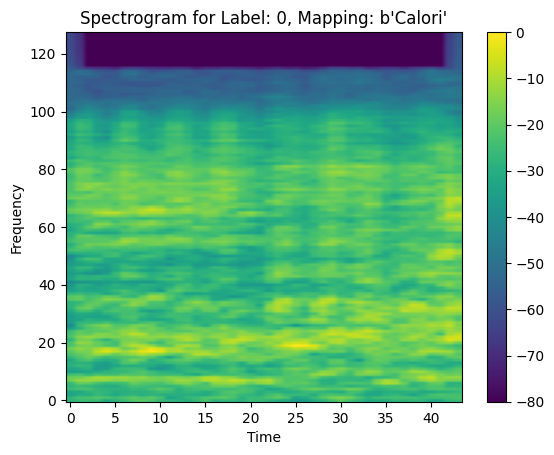

12838


In [ ]:
import h5py
import matplotlib.pyplot as plt

#0 -> calori
#100000 -> Visita di estranei


with h5py.File("/content/gdrive/MyDrive/DATASET_AUDIO_PATTERN/testDatasetProva2.h5", "r") as fp:
    spectrograms = fp['logMelSpec'][0]
    labels = fp["labels"][0]
    mapping = fp["mapping"][labels]

print("label -> ", str(labels), " of class ", str(mapping))

# Define the desired shape for individual spectrograms
desired_shape = (1, 128, 44, 1)

# Reshape the spectrogram to the desired shape
spectrogram = spectrograms.reshape(desired_shape)

# Get the time and frequency dimensions
time = range(spectrogram.shape[1])
frequency = range(spectrogram.shape[2])

# Plot the log-mel spectrogram
plt.imshow(spectrogram[0, :, :, 0], origin='lower', aspect='auto', cmap='viridis')
plt.xlabel('Time')
plt.ylabel('Frequency')
plt.title(f'Spectrogram for Label: {labels}, Mapping: {mapping}')
plt.colorbar()
plt.show()

with h5py.File("/content/gdrive/MyDrive/DATASET_AUDIO_PATTERN/testDatasetProva2.h5", "r") as fp:
    labels = fp["labels"][:]

print(len(labels))

['conv1', 'conv2', 'conv3', 'conv4', 'conv5', 'conv6', 'conv7', 'conv8', 'fc1', 'fc2', 'output']
AttributionResults(heatmap=tensor([[[-1.9157e-06, -2.7759e-06, -2.5386e-06,  ...,  9.1769e-07,
           6.5906e-07,  3.4197e-07],
         [-3.3492e-06, -4.9412e-06, -4.6716e-06,  ...,  1.4568e-06,
           1.1096e-06,  6.0424e-07],
         [-3.6536e-06, -5.5859e-06, -5.5935e-06,  ...,  1.6553e-06,
           1.3489e-06,  7.9353e-07],
         ...,
         [-1.8065e-06, -2.6717e-06, -2.7040e-06,  ..., -2.0639e-06,
          -2.0881e-06, -1.2448e-06],
         [-1.4659e-06, -2.2386e-06, -2.5632e-06,  ..., -1.9700e-06,
          -1.9096e-06, -1.0781e-06],
         [-9.9646e-07, -1.5246e-06, -1.7201e-06,  ..., -1.3335e-06,
          -1.2924e-06, -7.2144e-07]]]), activations={}, relevances={}, prediction=tensor([[0.1252, 0.1254, 0.1259, 0.1230, 0.1260, 0.1250, 0.1246, 0.1249]],
       grad_fn=<SoftmaxBackward0>))
True


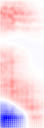

In [ ]:
import torch
from crp.concepts import ChannelConcept
import torchvision.transforms as T
from zennit.composites import EpsilonPlusFlat
from zennit.canonizers import SequentialMergeBatchNorm
from crp.attribution import CondAttribution
from crp.helper import get_layer_names
from crp.image import imgify
from crp.helper import get_layer_names
from crp.visualization import FeatureVisualization
import h5py
import matplotlib.pyplot as plt

# Assuming you have your PyTorch model stored in 'pytorch_model', load it here.
#model = pytorch_model
model.eval()

# Define the layer types you want to include in the layer names
layer_types = [torch.nn.Conv2d, torch.nn.Linear]  # Modify as needed

# Get a list of layer names in your model
layer_names = get_layer_names(model, layer_types)

# Print the layer names to find the correct one you want to condition on
print(layer_names)

# Load the logMelSpectrogram image.
with h5py.File("/content/gdrive/MyDrive/DATASET_AUDIO_PATTERN/testDatasetProva2.h5", "r") as fp:
    spectrograms = fp['logMelSpec'][5150]

# Define the desired shape for individual spectrograms
desired_shape = (1, 1, 128, 44)

# Reshape the spectrogram to the desired shape
spectrogram = spectrograms.reshape(desired_shape)

device = "cuda:0" if torch.cuda.is_available() else "cpu"
sample = torch.tensor(spectrogram).to(device)

composite = EpsilonPlusFlat([SequentialMergeBatchNorm()])
attribution = CondAttribution(model, no_param_grad=True)

# Compute heatmap for the spectrogram
conditions = [{"y": 0}]  # You can condition on specific classes if needed

# Convert sample to float
sample = sample.float()

# Now, continue with the rest of the code
sample.requires_grad = True
attr = attribution(sample, conditions, composite)

print(attr)

# Modify the following line with the class you want to condition on (e.g., class index 0):
desired_class = 2

# Modify the following line with the name of the layer you want to condition on (e.g., "Conv2d-1"):
desired_layer_name = "fc2"


# Compute heatmap of channel 35 in the specified layer conditioned on class output (adjust layer and class as needed)
conditions = [{"y": [desired_class], desired_layer_name: [128]}]
heatmap, _, _, _ = attribution(sample, conditions, composite)

# Print or visualize the heatmaps
print(torch.equal(attr[0], attr.heatmap))
imgify(attr.heatmap, symmetric=True)
imgify(heatmap, symmetric=True)




Processing layer conv1
torch.Size([1, 64])
tensor([ 8,  3,  7,  2, 63, 19])
tensor([14.4606, 10.3602,  7.8498,  7.7524,  6.3030,  5.3016])



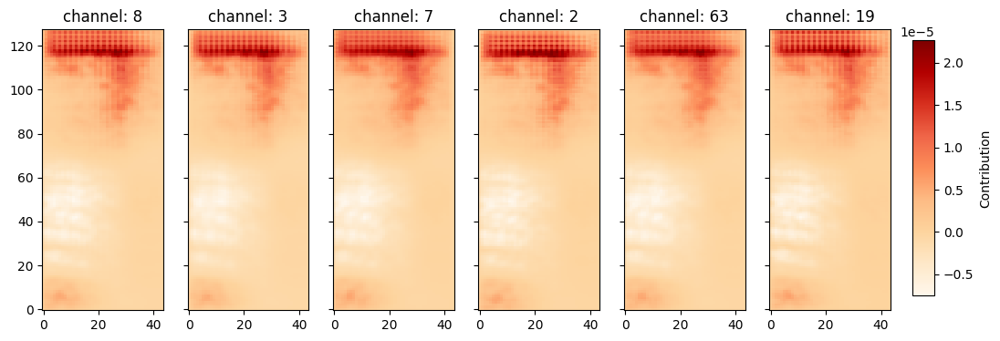


Processing layer conv2
torch.Size([1, 64])
tensor([ 9, 63,  0, 35, 15, 21])
tensor([15.5467,  5.8936,  5.3663,  4.5711,  4.4958,  4.3887])



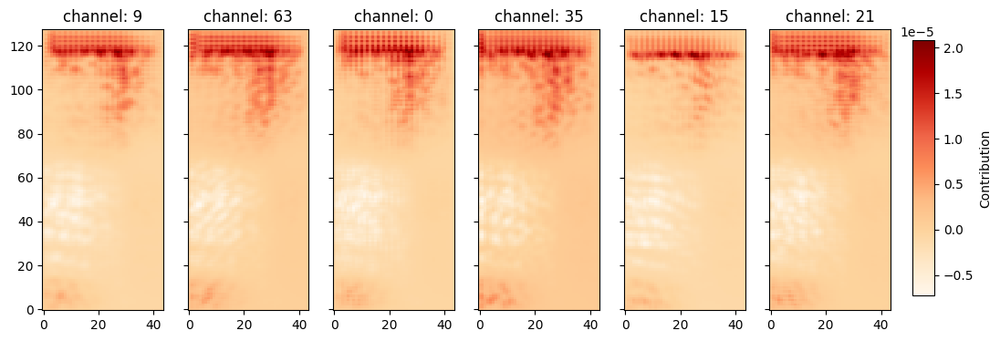


Processing layer conv3
torch.Size([1, 128])
tensor([12, 89,  5, 72, 63, 88])
tensor([5.9346, 5.2866, 4.4132, 3.6969, 3.6532, 3.6451])



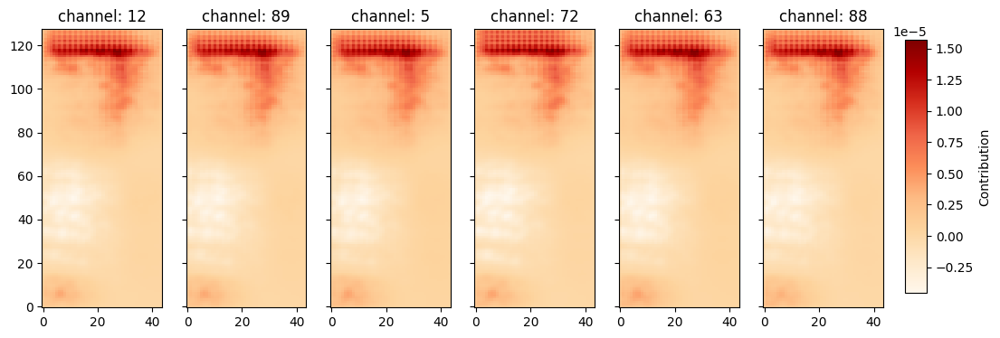


Processing layer conv4
torch.Size([1, 128])
tensor([ 79,  47,   4,  49,  24, 127])
tensor([3.9207, 3.7658, 3.3287, 3.3167, 3.1448, 3.0992])



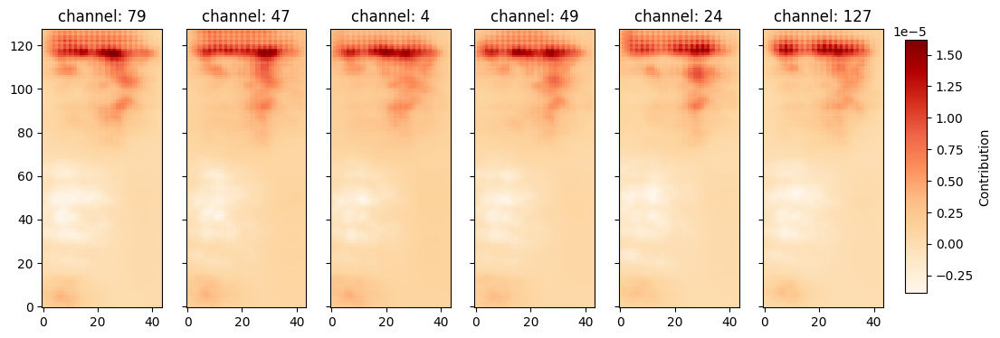


Processing layer conv5
torch.Size([1, 256])
tensor([251, 141,  64, 127,  22,  75])
tensor([2.8841, 2.2095, 2.1054, 1.9398, 1.7084, 1.6924])



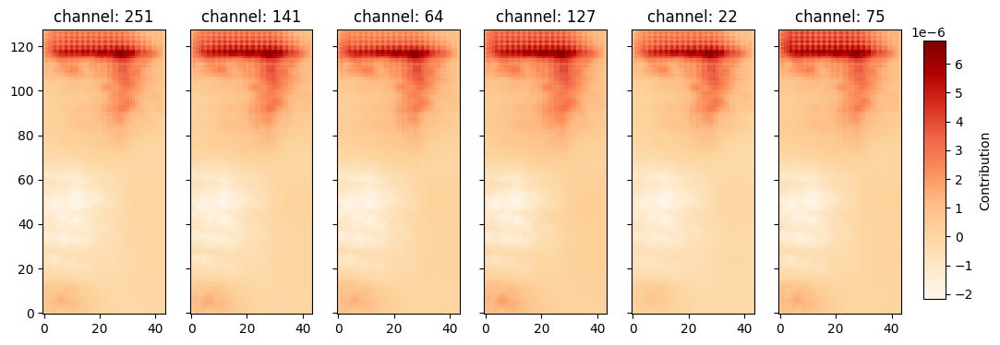


Processing layer conv6
torch.Size([1, 256])
tensor([153, 254,  75, 243,  53, 185])
tensor([2.2569, 2.2228, 2.1953, 1.9863, 1.9185, 1.8430])



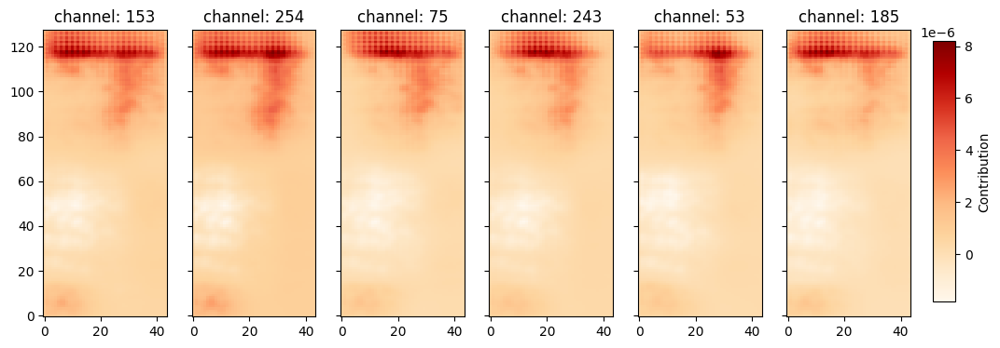


Processing layer conv7
torch.Size([1, 512])
tensor([115, 414,  16, 158, 341, 231])
tensor([1.8752, 1.3455, 1.3080, 1.2647, 1.2230, 1.2122])



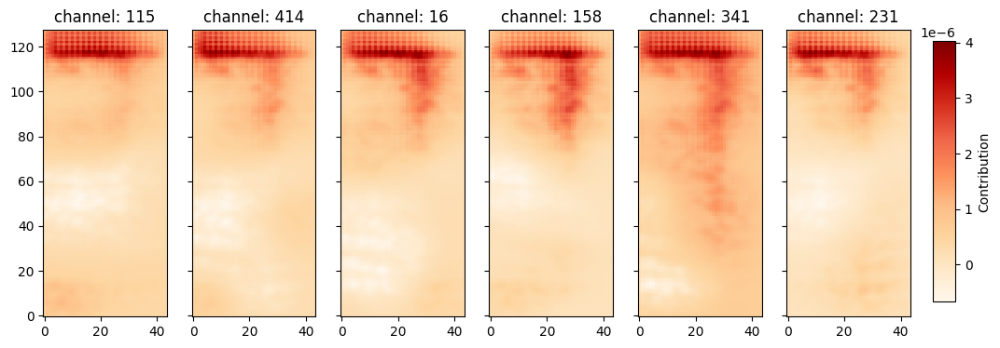


Processing layer conv8
torch.Size([1, 512])
tensor([182, 215, 241, 400, 495, 511])
tensor([2.0959, 1.8475, 1.7306, 1.5860, 1.2101, 1.1389])



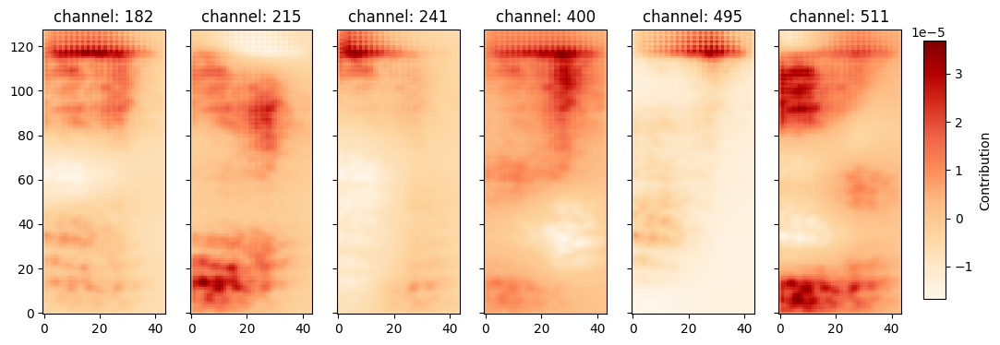


Processing layer fc1
torch.Size([1, 4096])
tensor([3920, 1853, 2156, 3311, 3452, 1346])
tensor([0.4759, 0.4310, 0.3749, 0.3657, 0.3608, 0.3132])



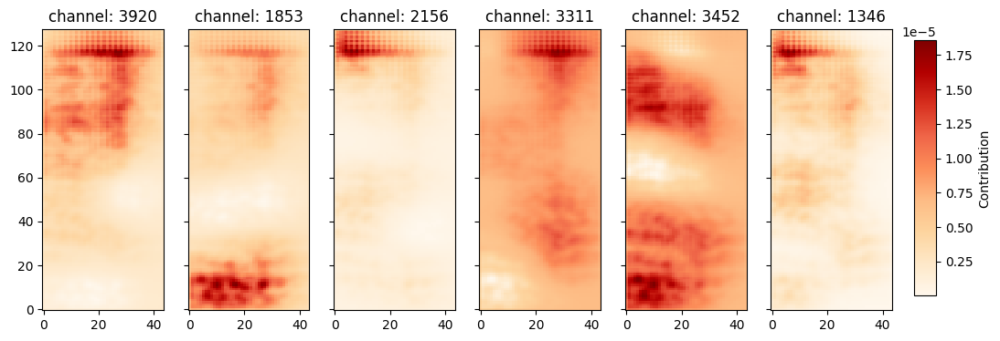


Processing layer fc2
torch.Size([1, 4096])
tensor([ 432, 2392, 3462, 3004, 2601, 3936])
tensor([0.3554, 0.2508, 0.2487, 0.2475, 0.2406, 0.2365])



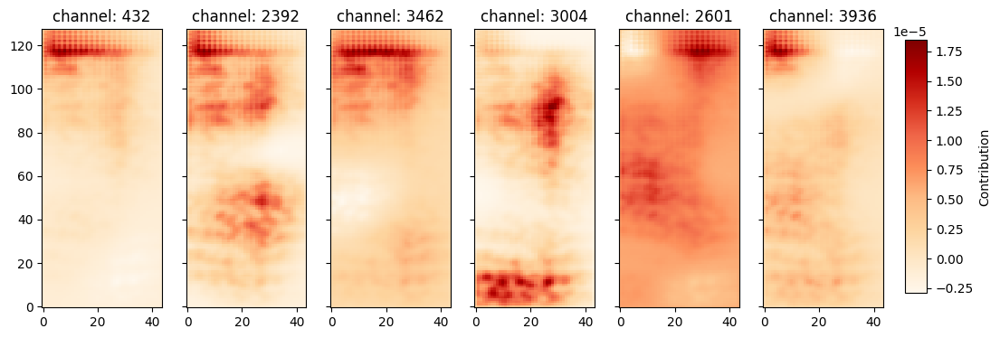

In [ ]:
from crp.concepts import ChannelConcept
from crp.helper import get_layer_names
from crp.visualization import FeatureVisualization
import h5py
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable

#representative spectrogram
#calori -> 7 -> conv8 -> freq. [mel -> 120, 65, 38, 42]
#presenza contemporanea -> 3607 -> conv8 -> freq.  [mel -> 119, 45, 44]
#Isolamento -> 5148 -> conv8 -> freq. [mel -> 118, 45]
#Separazione madre capretto -> 5619 -> conv -> freq. [mel. -> 44]



# Load the logMelSpectrogram image.
with h5py.File("/content/gdrive/MyDrive/DATASET_AUDIO_PATTERN/testDatasetProva2.h5", "r") as fp:
    spectrograms = fp['logMelSpec'][3606]

cc = ChannelConcept()

#set the class
classNumber = 7

#set the layer do you want to inspect
layerToProcess=['conv1', 'conv2', 'conv3', 'conv4', 'conv5', 'conv6', 'conv7', 'conv8', 'fc1', 'fc2']

for i in range(len(layerToProcess)):
  print("Processing layer " + str(layerToProcess[i]))

  # Define the desired shape for individual spectrograms
  desired_shape = (1, 1, 128, 44)

  # Reshape the spectrogram to the desired shape
  spectrogram = spectrograms.reshape(desired_shape)

  # Assuming you have your PyTorch model stored in 'pytorch_model', load it here.
  #model = pytorch_model
  model.eval()

  # Convert sample to float
  sample = torch.tensor(spectrogram, dtype=torch.float32, requires_grad=True)

  composite = EpsilonPlusFlat([SequentialMergeBatchNorm()])
  attribution = CondAttribution(model, no_param_grad=True)

  # Define the layer types you want to include in the layer names
  layer_types = [torch.nn.Conv2d, torch.nn.Linear]  # Modify as needed

  # Get a list of layer names in your model
  layer_names = get_layer_names(model, layer_types)

  #print(layer_names)

  conditions = [{'y': [classNumber]}]
  attr = attribution(sample, conditions, composite, record_layer=layer_names)

  # layer features.40 has 512 channel concepts
  rel_c = cc.attribute(attr.relevances[layerToProcess[i]], abs_norm=True)
  print(rel_c.shape)

  # the six most relevant concepts and their contribution to final classification in percent
  rel_values, concept_ids = torch.topk(rel_c[0], 6)
  concept_ids, rel_values*100

  print(concept_ids)
  print(rel_values*100)
  print("")

  conditions = [{layerToProcess[i]: [id], 'y': [classNumber]} for id in concept_ids]

  heatmap, _, _, _ = attribution(sample, conditions, composite)

  imgify(heatmap, cmap='wred', symmetric=False, grid=(1, len(concept_ids)), resize=780)

  # Assuming axs is an array of subplots
  fig, axs = plt.subplots(1, len(heatmap), figsize=(12, 4), sharey=True, gridspec_kw={'hspace': 0.5, 'wspace': 0.2})

  for i, slice_data in enumerate(heatmap):
      # Plot the original spectrogram with reduced opacity
      axs[i].imshow(spectrograms, cmap='viridis', aspect='auto', interpolation='none', alpha=1, origin="lower")

      #print(slice_data)

      # Overlay the heatmap with full opacity
      im = axs[i].imshow(slice_data, cmap='OrRd', aspect='auto', interpolation='none', alpha=1, origin="lower")

      # Overlay the heatmap with full opacity
      #im = axs[i].imshow(slice_data, cmap='Greys', aspect='auto', interpolation='none', alpha=0.6, origin="lower")
      axs[i].set_title(f'channel: {concept_ids[i]}')

  # Add colorbar to the right of the subplots
  cbar_ax = fig.add_axes([0.92, 0.15, 0.02, 0.7])  # [left, bottom, width, height]
  cbar = fig.colorbar(im, cax=cbar_ax, label='Contribution')

  plt.show()

  print("")

In [ ]:
from crp.concepts import ChannelConcept
from crp.helper import get_layer_names
from crp.visualization import FeatureVisualization
import h5py
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable

#representative spectrogram
#calori -> 7 -> conv8 -> freq. [mel -> 120, 65, 38, 42]
#presenza contemporanea -> 3607 -> conv8 -> freq.  [mel -> 119, 45, 44]
#Isolamento -> 5148 -> conv8 -> freq. [mel -> 118, 45]
#Separazione madre capretto -> 5619 -> conv -> freq. [mel. -> 44]

#0
#3605
#5148


# Load the logMelSpectrogram image.
with h5py.File("/content/gdrive/MyDrive/DATASET_AUDIO_PATTERN/testDatasetProva2.h5", "r") as fp:
    spectrograms = fp['logMelSpec'][1]
    label = fp['labels'][1]
    mapping = fp['mapping'][label]

cc = ChannelConcept()

print(mapping)
print(label)

#set the class
classNumber = 0

#set the layer do you want to inspect
layerToProcess=['conv8', 'fc1', 'fc2']

for i in range(len(layerToProcess)):
  #number of filters to consider
  nIds = 0

  if layerToProcess[i] == "conv1":
    nIds = 64

  if layerToProcess[i] == "conv2":
    nIds = 64

  if layerToProcess[i] == "conv3":
    nIds = 128

  if layerToProcess[i] == "conv4":
    nIds = 128

  if layerToProcess[i] == "conv5":
    nIds = 256

  if layerToProcess[i] == "conv6":
    nIds = 256

  if layerToProcess[i] == "conv7":
    nIds = 512

  if layerToProcess[i] == "conv8":
    nIds = 512

  if layerToProcess[i] == "fc1":
    nIds = 4096

  if layerToProcess[i] == "fc2":
    nIds = 4096



  print("Processing layer " + str(layerToProcess[i]))

  # Define the desired shape for individual spectrograms
  desired_shape = (1, 1, 128, 44)

  # Reshape the spectrogram to the desired shape
  spectrogram = spectrograms.reshape(desired_shape)

  # Assuming you have your PyTorch model stored in 'pytorch_model', load it here.
  #model = pytorch_model
  model.eval()

  # Convert sample to float
  sample = torch.tensor(spectrogram, dtype=torch.float32, requires_grad=True)

  composite = EpsilonPlusFlat([SequentialMergeBatchNorm()])
  attribution = CondAttribution(model, no_param_grad=True)

  # Define the layer types you want to include in the layer names
  layer_types = [torch.nn.Conv2d, torch.nn.Linear]  # Modify as needed

  # Get a list of layer names in your model
  layer_names = get_layer_names(model, layer_types)

  #print(layer_names)

  conditions = [{'y': [classNumber]}]
  attr = attribution(sample, conditions, composite, record_layer=layer_names)

  # layer features.40 has 512 channel concepts
  rel_c = cc.attribute(attr.relevances[layerToProcess[i]], abs_norm=True)
  print(rel_c.shape)

  # the six most relevant concepts and their contribution to final classification in percent
  rel_values, concept_ids = torch.topk(rel_c[0], 20)
  concept_ids, rel_values*100

  #print(concept_ids)
  #print(rel_values*100)

  sum_rel_values = torch.sum(rel_values)
  print("Sum of values in the tensor:", sum_rel_values*100)

  print("")

  conditions = [{layerToProcess[i]: [id], 'y': [classNumber]} for id in concept_ids]

  heatmap, _, _, _ = attribution(sample, conditions, composite)

  imgify(heatmap, cmap='wred', symmetric=False, grid=(1, len(concept_ids)), resize=780)

  # Assuming axs is an array of subplots
  fig, axs = plt.subplots(1, len(heatmap), figsize=(30, 4), sharey=True, gridspec_kw={'hspace': 0.5, 'wspace': 0.2})

  threshold_high = 0.65
  threshold_medium = 0.55

  heatmap = np.array(heatmap)  # Convert to a NumPy array

  # Normalize the heatmap values
  normalized_heatmap = (heatmap - np.min(heatmap)) / (np.max(heatmap) - np.min(heatmap))


  for i, slice_data in enumerate(normalized_heatmap):
      # Find indices where relevance values exceed the thresholds
      high_value_indices_high = np.where(slice_data > threshold_high)
      high_value_indices_medium = np.where((slice_data <= threshold_high) & (slice_data > threshold_medium))

       # Get the x and y coordinates of high-value points for different thresholds
      x_coords_high, y_coords_high = high_value_indices_high
      x_coords_medium, y_coords_medium = high_value_indices_medium

      #print("high coordinates: " + " " + str(x_coords_high))

      if len(x_coords_high) != 0:
        fig, ax = plt.subplots(figsize=(8, 6))  # Adjust size as needed
        ax.imshow(spectrograms, cmap='viridis', aspect='auto', interpolation='none', alpha=1, origin="lower")
        ax.scatter(y_coords_high, x_coords_high, color='red', s=5, alpha=0.8, label='High (>0.8)')
        ax.scatter(y_coords_medium, x_coords_medium, color='orange', s=5, alpha=0.8, label='Medium (0.5-0.8)')
        ax.set_title(f'channel: {concept_ids[i]}')
        ax.set_yticks(np.arange(0, 129, 16))
        ax.set_yticklabels(np.arange(0, 129, 16))
        ax.legend()
        plt.show()


  print("")



b'Calori'
0
Processing layer conv8
torch.Size([1, 512])
Sum of values in the tensor: tensor(18.2231)



KeyboardInterrupt: ignored

In [ ]:
!pip install pydub

In [ ]:
values = [
    7.2754e-02, 4.7267e-02, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
    0.0000e+00, -3.3801e-04, -7.8372e-04, -2.9484e-03, -1.0210e-02, -1.1337e-02, -1.1413e-02, -1.2422e-02, -1.4883e-02, -1.5340e-02,
    -6.5365e-02, -8.9183e-02, -9.1938e-02, -1.1186e-01, -1.3761e-01, -2.3689e-01, -2.4721e-01, -2.8883e-01, -2.9193e-01, -3.4991e-01,
    -3.6204e-01, -4.1397e-01, -4.4865e-01, -4.8743e-01, -5.1967e-01, -6.3899e-01, -7.9785e-01, -8.3005e-01, -9.7137e-01, -1.1456e+00,
    -1.1498e+00, -1.1534e+00, -1.5514e+00, -1.5595e+00, -1.5963e+00, -1.9760e+00, -1.9884e+00, -2.2550e+00, -2.7139e+00, -2.7269e+00,
    -2.7439e+00, -2.8331e+00, -2.9531e+00, -3.3274e+00, -3.5469e+00, -3.8195e+00, -3.9139e+00, -4.5144e+00, -5.0421e+00, -5.3057e+00,
    -6.6992e+00, -7.9702e+00, -8.5760e+00, -1.1358e+01
]

sum_values = sum(values)
print("Sum of values:", sum_values)

Sum of values: -99.76000013000001


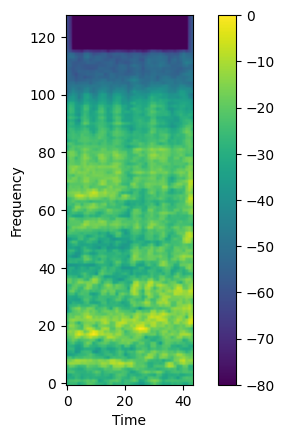

In [ ]:
import matplotlib.pyplot as plt

# Define the desired shape for individual spectrograms
desired_shape = (128, 44, 1)

# Reshape the spectrogram to the desired shape
spectrogram = spectrograms.reshape(desired_shape)

# Get the time and frequency dimensions
time = range(spectrogram.shape[1])
frequency = range(spectrogram.shape[0])

# Plot the log-mel spectrogram with both time and frequency dimensions
plt.imshow(spectrogram[:, :, 0], origin='lower', aspect='equal', cmap='viridis')
plt.xlabel('Time')
plt.ylabel('Frequency')
plt.colorbar()
plt.show()


In [ ]:
"""
import torch
from torch.utils.data import Dataset
import h5py
import torchvision.transforms as T
import numpy as np


# Open the h5 file and extract the necessary data
with h5py.File("/content/gdrive/MyDrive/DATASET_AUDIO_PATTERN/testDatasetProva2.h5", "r") as fp:
    spectrograms = fp['logMelSpec'][:]  # Extract all spectrograms
    labels = fp["labels"][:]  # Extract all labels
    mapping = fp["mapping"][:]  # Extract all mapping

# Define the desired shape for individual spectrograms
desired_shape = (128, 44)

# Preprocess and structure the data into a list of samples
samples = []
for i in range(len(spectrograms)):
    sample = {
        'spectrogram': spectrograms[i].reshape(desired_shape),  # Reshape to the desired shape
        'label': int(labels[i]),
        'mapping': mapping[labels[i]],
        'sample_indices': i  # Add the sample index to the sample dictionary
    }
    samples.append(sample)
"""

import torch
from torch.utils.data import Dataset
import h5py
import torchvision.transforms as T
import numpy as np

# Open the h5 file and extract the necessary data
with h5py.File("/content/gdrive/MyDrive/DATASET_AUDIO_PATTERN/testDatasetProva2.h5", "r") as fp:
    spectrograms = fp['logMelSpec'][:]  # Extract all spectrograms
    labels = fp["labels"][:]  # Extract all labels
    mapping = fp["mapping"][:]  # Extract all mapping

# Define the desired shape for individual spectrograms
desired_shape = (128, 44)

# Preprocess and structure the data into a list of samples
samples_per_label = 80
label_count = [0] * 8  # Initialize a count for each label

samples = []
for i in range(len(spectrograms)):
    label = int(labels[i])
    if label_count[label] < samples_per_label:
        sample = {
            'spectrogram': spectrograms[i].reshape(desired_shape),  # Reshape to the desired shape
            'label': label,
            'mapping': mapping[label],
            'sample_indices': i  # Add the sample index to the sample dictionary
        }
        samples.append(sample)
        label_count[label] += 1

    # Break the loop once we have enough samples for each label
    if all(count == samples_per_label for count in label_count):
        break


In [ ]:
print(samples[639])

{'spectrogram': array([[-29.75073051, -32.54828644, -38.16965866, ..., -32.63944244,
        -34.02384567, -39.53518677],
       [-31.22883987, -31.60627937, -33.8039093 , ..., -34.59285355,
        -34.34960175, -39.55043411],
       [-38.38044739, -35.28772736, -36.32453918, ..., -39.53943634,
        -32.37716293, -32.21509552],
       ...,
       [-72.07920837, -78.10800171, -80.        , ..., -80.        ,
        -70.28207397, -63.339077  ],
       [-72.1338501 , -78.16271973, -80.        , ..., -80.        ,
        -70.31747437, -63.37455368],
       [-72.1699295 , -78.19883728, -80.        , ..., -80.        ,
        -70.3417511 , -63.39887238]]), 'label': 7, 'mapping': b'Fenomeni legati al parto', 'sample_indices': 11141}


In [ ]:
import torch
from torch.utils.data import Dataset
import numpy as np
from PIL import Image

class CustomImageDataset(Dataset):
    def __init__(self, samples, transform=None):
        self.samples = samples
        self.transform = transform

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, index):
        sample = self.samples[index]
        spectrogram = sample['spectrogram'].astype('float32')
        spectrogram = torch.from_numpy(spectrogram)

        labels = int(sample['label'])
        tensor_labels = torch.tensor(sample['label'])

        # Convert spectrogram to PIL image
        pil_image = Image.fromarray(spectrogram.numpy())

        if self.transform:
            pil_image = self.transform(pil_image)

        return (pil_image, labels)


In [ ]:
# Instantiate your custom dataset
import torchvision.transforms as transforms
custom_dataset = CustomImageDataset(samples, transform=transforms.ToTensor())


In [ ]:
# feature visualization
from crp.concepts import ChannelConcept
from crp.helper import get_layer_names
from crp.visualization import FeatureVisualization
from crp.attribution import CondAttribution

cc = ChannelConcept()

layer_names = get_layer_names(model, [torch.nn.Conv2d, torch.nn.Linear])
layer_map = {layer : cc for layer in layer_names}

attribution = CondAttribution(model)

# Assuming your input size is (1, 128, 44)
mean_value = 0.5  # Adjust this based on your data
std_value = 0.5  # Adjust this based on your data

preprocessing_custom = T.Normalize(mean=[mean_value], std=[std_value])

data_path = "/content/gdrive/MyDrive/DATASET_AUDIO_PATTERN/" #TODO fill or run download below

#batchedData = DataLoader(custom_dataset, batch_size=32, shuffle=True)

print(data_path)

fv = FeatureVisualization(attribution, custom_dataset, layer_map, path='/content/gdrive/MyDrive/DATASET_AUDIO_PATTERN/')

/content/gdrive/MyDrive/DATASET_AUDIO_PATTERN/


In [ ]:
print(len(custom_dataset))

print(custom_dataset)
print(custom_dataset[0][0].dtype)
print(custom_dataset[0][0].size())
print(custom_dataset[0])
print(custom_dataset[0][1])


640
torch.float32
torch.Size([1, 128, 44])
(tensor([[[-28.2711, -25.6135, -25.4446,  ..., -31.8936, -26.5841, -25.2237],
         [-27.7383, -23.6400, -23.1474,  ..., -24.3583, -23.7476, -22.9111],
         [-33.5177, -30.0808, -30.6002,  ..., -22.4084, -23.3548, -23.5842],
         ...,
         [-62.2806, -68.3258, -80.0000,  ..., -80.0000, -64.5095, -57.5771],
         [-62.3397, -68.3843, -80.0000,  ..., -80.0000, -64.5767, -57.6442],
         [-62.3767, -68.4209, -80.0000,  ..., -80.0000, -64.6203, -57.6878]]]), 0)
0


In [ ]:
# Add the following lines for debugging
sample_indices = np.arange(len(custom_dataset))
unique_indices = np.unique(sample_indices, return_index=True)[1][:len(custom_dataset)]
print("Length of unique_indices:", len(unique_indices))
print("Unique indices:", unique_indices)

Length of unique_indices: 12838
Unique indices: [    0     1     2 ... 12835 12836 12837]


In [ ]:
# Assuming custom_dataset is an instance of CustomImageDataset
for i in range(len(custom_dataset)):
    spectrogram, targets = custom_dataset[i]
    print(f"Sample {i + 1} - Spectrogram data type: {spectrogram.dtype}")
    print(f"Sample {i + 1} - Targets data type: {targets.dtype}")


In [ ]:
# Assuming custom_dataset is an instance of CustomImageDataset
for i in range(len(custom_dataset)):
    _, labels_tensor = custom_dataset[i]
    print(f"Sample {i + 1} - Label data type: {labels_tensor.dtype}")


In [ ]:
from zennit.canonizers import SequentialMergeBatchNorm
from zennit.composites import EpsilonPlusFlat
canonizers = [SequentialMergeBatchNorm()]
composite = EpsilonPlusFlat(canonizers)

saved_files = fv.run(composite, 0, len(custom_dataset), batch_size=32, checkpoint=100)



Running Analysis...


100%|██████████| 20/20 [03:55<00:00, 11.77s/it]


100%|██████████| 88/88 [00:01<00:00, 69.45it/s] 


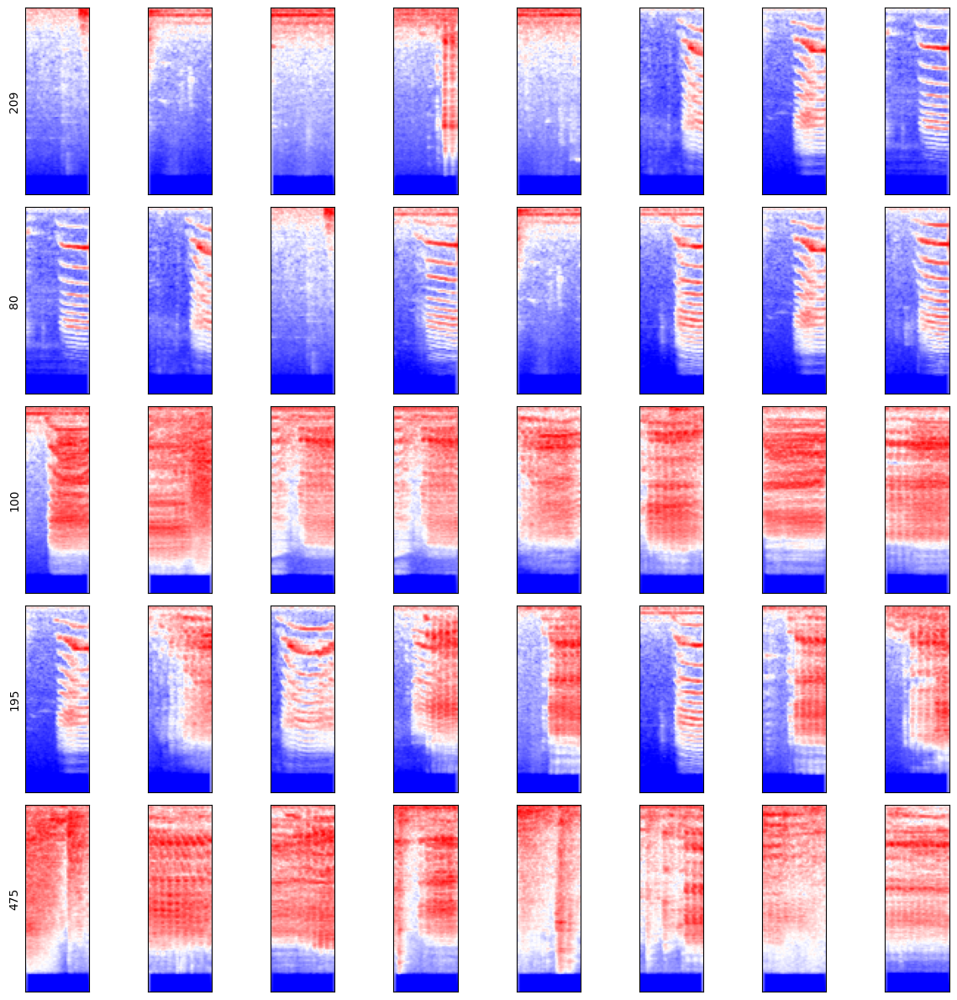

In [ ]:
%matplotlib inline
from crp.image import plot_grid

ref_c = fv.get_max_reference([209, 80, 100, 195, 475], "conv8", "activation", (0, 8))

#print(ref_c)

plot_grid(ref_c, cmap="bwr", figsize=(12, 12), padding=False)

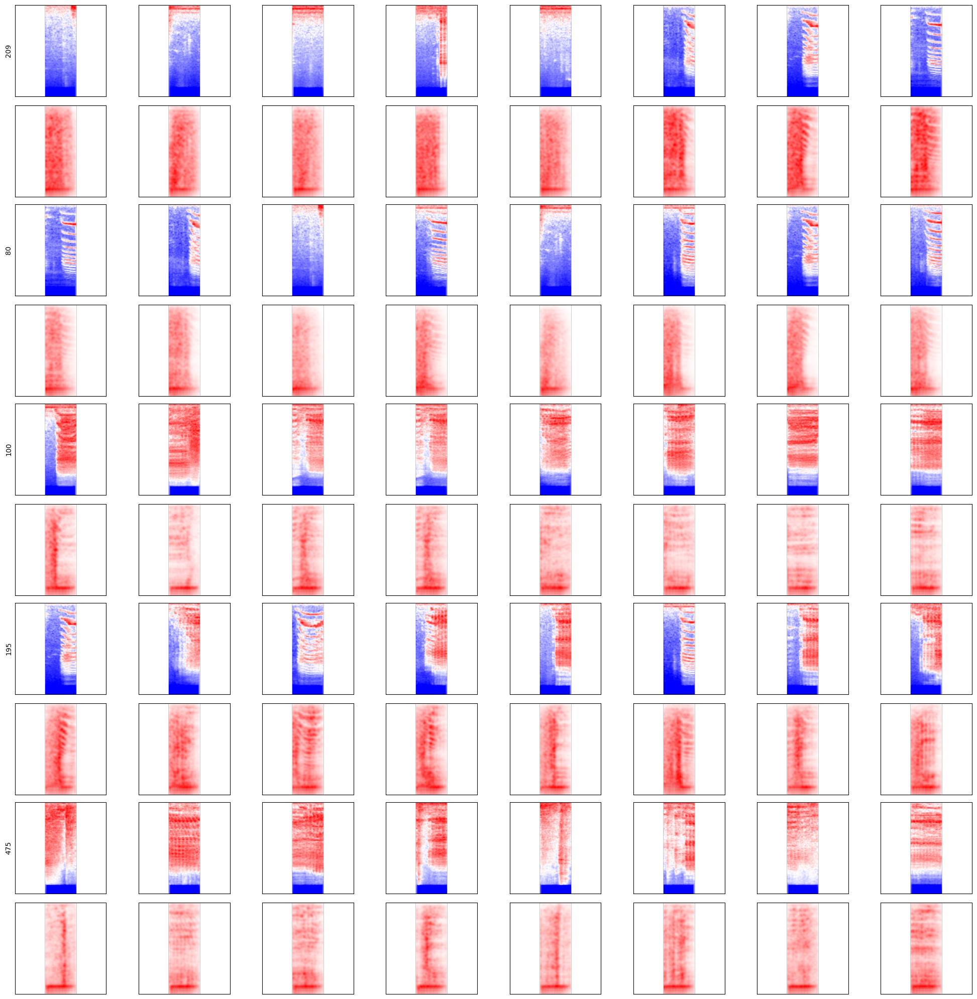

In [ ]:
ref_c = fv.get_max_reference([209, 80, 100, 195, 475], "conv8", "activation", (0, 8), composite=composite, plot_fn=None)

plot_grid(ref_c, figsize=(20, 20))

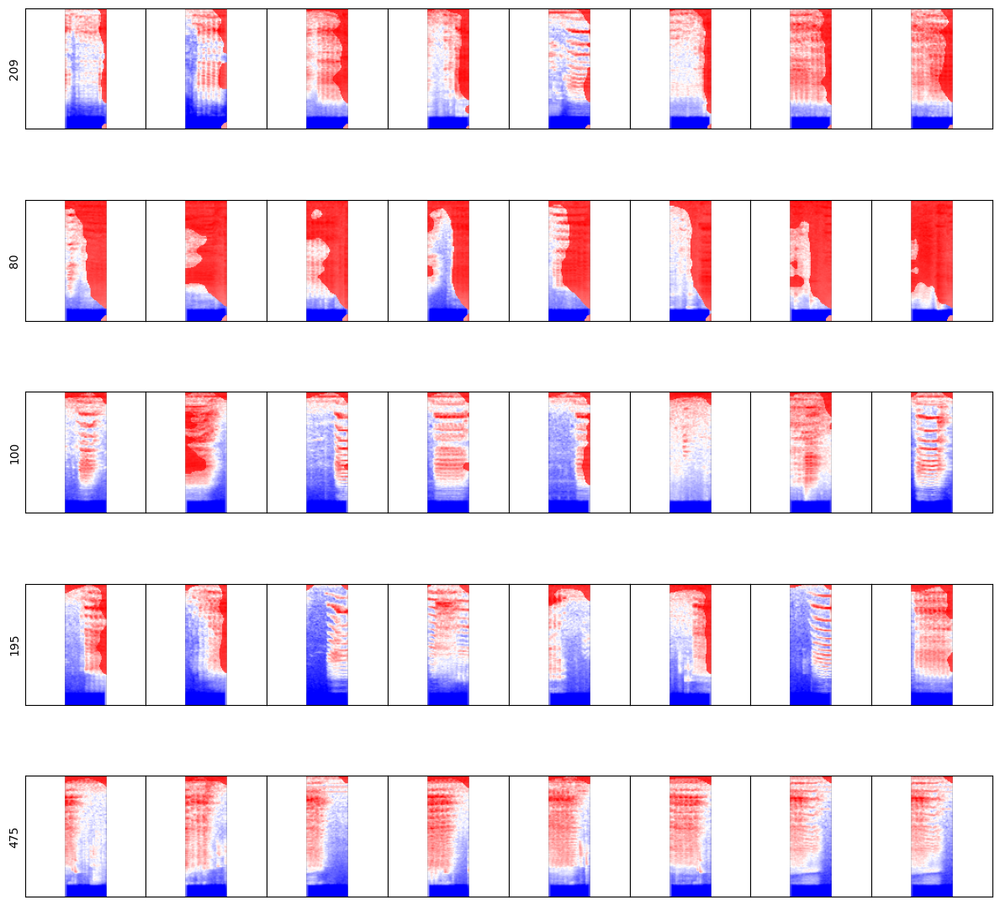

In [ ]:
from crp.image import vis_opaque_img

ref_c = fv.get_max_reference([209, 80, 100, 195, 475], "conv8", "relevance", (0, 8), composite=composite, plot_fn=vis_opaque_img)

plot_grid(ref_c, cmap="viridis", symmetric=True, figsize=(12, 12))

In [ ]:
#targets, rel = fv.compute_stats(63, "conv2", "relevance", top_N=8, norm=True)
#print(targets)
#print(rel)

nFilters = 64
layerName = "conv8"

for i in range(nFilters):
  targets, rel = fv.compute_stats(i, layerName, "relevance", top_N=8, norm=True)
  print("Ch: " + str(i))
  print(targets)
  print(rel)
  print("")
  print("----------------------------------------------------")
  print("")



"""
ref_t = fv.get_stats_reference(56, "conv8", targets, "relevance", (0, 8), rf=True, composite=composite, plot_fn=vis_opaque_img)

plot_grid(ref_t, figsize=(12, 12), padding=False)
"""

Ch: 0
[0 4 6 3 2 1 7 5]
tensor([1.0000, 0.7257, 0.5399, 0.5241, 0.3318, 0.2830, 0.2229, 0.1730])

----------------------------------------------------

Ch: 1
[7 0 1 3 6 2 4 5]
tensor([1.0000, 0.5048, 0.4804, 0.4696, 0.4565, 0.3988, 0.3633, 0.2345])

----------------------------------------------------

Ch: 2
[0 2 4 6 1 3 7 5]
tensor([1.0000, 0.3731, 0.3437, 0.3234, 0.2640, 0.2319, 0.2267, 0.1464])

----------------------------------------------------

Ch: 3
[7 5 6 3 0 1 2 4]
tensor([1.0000, 0.8211, 0.6227, 0.5815, 0.4258, 0.4232, 0.3659, 0.1586])

----------------------------------------------------

Ch: 4
[1 7 2 3 4 6 0 5]
tensor([1.0000, 0.2488, 0.0298, 0.0038, 0.0031, 0.0013, 0.0000, 0.0000])

----------------------------------------------------

Ch: 5
[7 5 6 3 0 2 1 4]
tensor([1.0000, 0.7467, 0.7367, 0.6559, 0.4054, 0.3997, 0.3883, 0.2862])

----------------------------------------------------

Ch: 6
[1 0 4 2 6 3 5 7]
tensor([1.0000, 0.7366, 0.6751, 0.5753, 0.5380, 0.5195, 0.3615, 

'\nref_t = fv.get_stats_reference(56, "conv8", targets, "relevance", (0, 8), rf=True, composite=composite, plot_fn=vis_opaque_img)\n\nplot_grid(ref_t, figsize=(12, 12), padding=False)\n'

##**Average Heatmap**

spectrogram 0
b'Calori'
0
spectrogram in processing... 0
Processing layer conv1
torch.Size([1, 64])
Sum of values in the tensor: tensor(0.0003)

spectrogram in processing... 0
Processing layer conv2
torch.Size([1, 64])
Sum of values in the tensor: tensor(0.0019)

spectrogram in processing... 0
Processing layer conv3
torch.Size([1, 128])
Sum of values in the tensor: tensor(0.0014)

spectrogram in processing... 0
Processing layer conv4
torch.Size([1, 128])
Sum of values in the tensor: tensor(0.0016)

spectrogram in processing... 0
Processing layer conv5
torch.Size([1, 256])
Sum of values in the tensor: tensor(0.0045)

spectrogram in processing... 0
Processing layer conv6
torch.Size([1, 256])
Sum of values in the tensor: tensor(0.0248)

spectrogram in processing... 0
Processing layer conv7
torch.Size([1, 512])
Sum of values in the tensor: tensor(1.8490)

spectrogram 1
b'Calori'
0
spectrogram in processing... 1
Processing layer conv1
torch.Size([1, 64])
Sum of values in the tensor: tensor(

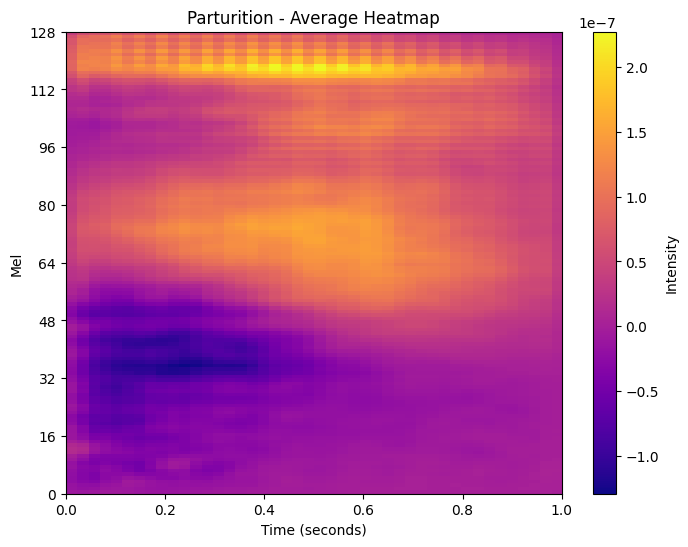

In [ ]:
from crp.concepts import ChannelConcept
from crp.helper import get_layer_names
from crp.visualization import FeatureVisualization
import h5py
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable

#representative spectrogram
#calori -> 7 -> conv8 -> freq. [mel -> 120, 65, 38, 42]
#presenza contemporanea -> 3607 -> conv8 -> freq.  [mel -> 119, 45, 44]
#Isolamento -> 5148 -> conv8 -> freq. [mel -> 118, 45]
#Separazione madre capretto -> 5619 -> conv -> freq. [mel. -> 44]

#0
#3605
#5148

heatmaps_for_average = []

for index in range(100):
  print("spectrogram " + str(index))
  #process a spectrogram
  with h5py.File("/content/gdrive/MyDrive/DATASET_AUDIO_PATTERN/testDatasetProva2.h5", "r") as fp:
    spectrograms = fp['logMelSpec'][index + 0]
    label = fp['labels'][index + 0]
    mapping = fp['mapping'][label]

  cc = ChannelConcept()

  print(mapping)
  print(label)

  #set the class
  classNumber = 0

  #set the layer do you want to inspect
  layerToProcess=['conv1', 'conv2', 'conv3', 'conv4', 'conv5', 'conv6', 'conv7']

  for i in range(len(layerToProcess)):

    print("spectrogram in processing... " + str(index))

    print("Processing layer " + str(layerToProcess[i]))

    # Define the desired shape for individual spectrograms
    desired_shape = (1, 1, 128, 44)

    # Reshape the spectrogram to the desired shape
    spectrogram = spectrograms.reshape(desired_shape)

    model.eval()

    # Convert sample to float
    sample = torch.tensor(spectrogram, dtype=torch.float32, requires_grad=True)

    composite = EpsilonPlusFlat([SequentialMergeBatchNorm()])
    attribution = CondAttribution(model, no_param_grad=True)

    # Define the layer types you want to include in the layer names
    layer_types = [torch.nn.Conv2d, torch.nn.Linear]  # Modify as needed

    # Get a list of layer names in your model
    layer_names = get_layer_names(model, layer_types)

    #print(layer_names)

    conditions = [{'y': [classNumber]}]
    attr = attribution(sample, conditions, composite, record_layer=layer_names)

    # layer features.40 has 512 channel concepts
    rel_c = cc.attribute(attr.relevances[layerToProcess[i]], abs_norm=True)
    print(rel_c.shape)

    # the six most relevant concepts and their contribution to final classification in percent
    rel_values, concept_ids = torch.topk(rel_c[0], 5)
    concept_ids, rel_values*100

    sum_rel_values = torch.sum(rel_values)
    print("Sum of values in the tensor:", sum_rel_values*100)

    print("")

    conditions = [{layerToProcess[i]: [id], 'y': [classNumber]} for id in concept_ids]

    heatmap, _, _, _ = attribution(sample, conditions, composite)

    heatmaps_for_average.append(heatmap)

with h5py.File("/content/gdrive/MyDrive/DATASET_AUDIO_PATTERN/testDatasetProva2.h5", "r") as fp:
    spectrograms = fp['logMelSpec'][0]
    label = fp['labels'][0]
    mapping = fp['mapping'][label]

# Compute the average across all heatmaps along the 0-th dimension
all_heatmaps = torch.cat(heatmaps_for_average, dim=0)
average_heatmap = torch.mean(all_heatmaps, dim=0)

# Reshape the average heatmap to add a new dimension
average_heatmap = average_heatmap.unsqueeze(2)  # Unsqueezing along the second axis

print("Shape of the adjusted average heatmap:", average_heatmap.shape)

# Convert PyTorch tensor to NumPy array for plotting
average_heatmap_np = average_heatmap.squeeze().numpy()

plt.figure(figsize=(8, 6))
im = plt.imshow(average_heatmap_np, cmap='plasma', aspect='auto', interpolation='none', origin='lower', extent=[0, 1, 0, 128])
plt.title('Parturition - Average Heatmap')
plt.xlabel('Time (seconds)')
plt.ylabel('Mel')
plt.colorbar(im, label='Intensity')


plt.yticks(np.arange(0, 129, 16), np.arange(0, 129, 16))  # Set y-axis ticks and labels
plt.show()





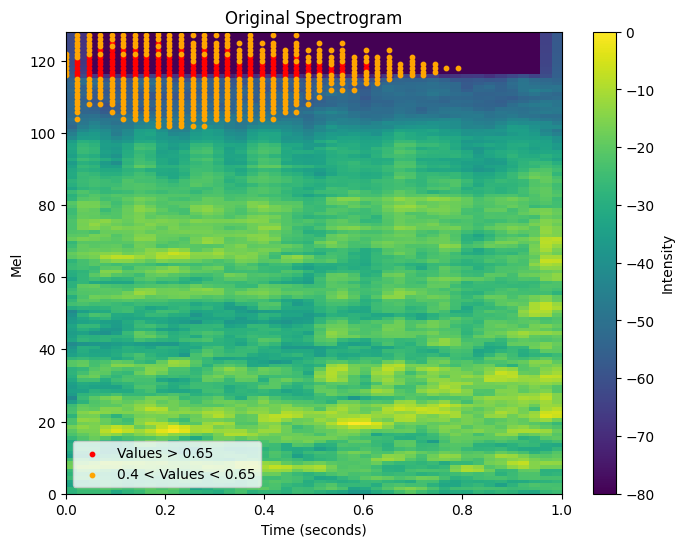

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Assuming spectrograms is your original spectrogram

# Create a meshgrid to match the heatmap dimensions with spectrogram dimensions
x = np.linspace(0, 1, average_heatmap_np.shape[1])  # Time axis
y = np.linspace(0, 128, average_heatmap_np.shape[0])  # Mel axis
X, Y = np.meshgrid(x, y)

# Normalize the heatmap values between 0 and 1
normalized_heatmap = (average_heatmap_np - np.min(average_heatmap_np)) / (np.max(average_heatmap_np) - np.min(average_heatmap_np))

# Plot the original spectrogram
plt.figure(figsize=(8, 6))
im = plt.imshow(spectrograms, cmap='viridis', aspect='auto', interpolation='none', origin='lower', extent=[0, 1, 0, 128])
plt.title('Original Spectrogram')
plt.xlabel('Time (seconds)')
plt.ylabel('Mel')
plt.colorbar(im, label='Intensity')  # Add a colorbar for reference (optional)

# Threshold the heatmap to get coordinates for different ranges of values
threshold_red = 0.65  # Upper threshold for red points
threshold_orange = 0.4  # Lower threshold for orange points
threshold_light_orange = 0.6  # Lower threshold for lighter orange points

# Get indices for red points (values above 0.8)
high_value_red_indices = np.where(normalized_heatmap > threshold_red)

# Plot red points on the spectrogram where the heatmap values exceed the red threshold
plt.scatter(X[high_value_red_indices], Y[high_value_red_indices], color='red', s=10, label='Values > 0.65')  # Adjust 's' for point size

# Get indices for orange points (values between 0.5 and 0.8)
orange_indices = np.where((normalized_heatmap > threshold_orange) & (normalized_heatmap <= threshold_red))

# Plot orange points on the spectrogram where the heatmap values are between 0.5 and 0.8
plt.scatter(X[orange_indices], Y[orange_indices], color='orange', s=10, label='0.4 < Values < 0.65')  # Adjust 's' for point size

# Get indices for lighter orange points (values between 0 and 0.5)
light_orange_indices = np.where((normalized_heatmap > 0) & (normalized_heatmap <= threshold_orange))

# Define a lighter shade of orange (adjust RGB values)
light_orange_color = (1, 1, 1)  # RGB values for a lighter orange

# Plot lighter orange points on the spectrogram where the heatmap values are between 0 and 0.5
#plt.scatter(X[light_orange_indices], Y[light_orange_indices], color=light_orange_color, s=10)  # Adjust 's' for point size
# Show the legend
plt.legend()
# Show the plot
plt.show()


#**EXPLAINABILITY MOBILENET: CRP**

In [ ]:
!pip install efficientnet_pytorch


  Preparing metadata (setup.py) ... done
  Created wheel for efficientnet_pytorch: filename=efficientnet_pytorch-0.7.1-py3-none-any.whl size=16428 sha256=3afdc1a93861d27bc51338f5a7e7fd9be528a9e2f0bca7d3341f423633e09ece
  Stored in directory: /root/.cache/pip/wheels/03/3f/e9/911b1bc46869644912bda90a56bcf7b960f20b5187feea3baf
Successfully built efficientnet_pytorch


In [ ]:
import torch
import torch.nn as nn
from torchvision import models
from torchsummary import summary

import torch.nn.functional as F
from efficientnet_pytorch import EfficientNet

class EffNetB0(nn.Module):
    def __init__(self):
        super(EffNetB0, self).__init__()

        # Load pre-trained EfficientNetB0 model
        self.base_model = EfficientNet.from_pretrained('efficientnet-b0')

        # Freeze the base model parameters
        for param in self.base_model.parameters():
            param.requires_grad = False

        # Add additional layers on top of the base model
        self.fc1 = nn.Linear(1280, 4096)
        self.dropout1 = nn.Dropout(0.3)
        self.fc2 = nn.Linear(4096, 4096)
        self.dropout2 = nn.Dropout(0.3)
        self.fc3 = nn.Linear(4096, 8)

    def forward(self, x):
        # Resize input
        x = F.interpolate(x, size=(224, 224), mode='bilinear', align_corners=False)

        # Replicate input along channel axis to match EfficientNet's input channels (3 channels)
        x = torch.cat([x, x, x], dim=1)

        # Pass through base model
        x = self.base_model.extract_features(x)
        x = F.adaptive_avg_pool2d(x, 1).squeeze(-1).squeeze(-1)

        # Fully connected layers
        x = F.relu(self.fc1(x))
        x = self.dropout1(x)
        x = F.relu(self.fc2(x))
        x = self.dropout2(x)
        x = self.fc3(x)
        return x


tf_model = tf.saved_model.load('/content/gdrive/MyDrive/DATASET_AUDIO_PATTERN/EffNetB0_vocapra_model')

# Create an instance of the PyTorch model
pytorch_model = EffNetB0()

# Transfer the weights from TensorFlow to PyTorch
for tf_layer, torch_layer in zip(tf_model.keras_api.layers, pytorch_model.children()):
    if isinstance(tf_layer, tf.keras.layers.Conv2D) and isinstance(torch_layer, nn.Conv2d):
        # Transfer Conv2D weights
        weights, biases = tf_layer.get_weights()
        torch_layer.weight.data = torch.from_numpy(weights.transpose(3, 2, 0, 1))
        torch_layer.bias.data = torch.from_numpy(biases)

# Assuming you already have your PyTorch model created
input_size = (1, 128, 44)  # Define the input size as a single tuple
summary(pytorch_model, input_size)

# Save the PyTorch model
torch.save(pytorch_model.state_dict(), '/content/gdrive/MyDrive/DATASET_AUDIO_PATTERN/effNetB0_pytorch_model.pth')


In [ ]:
# Load the PyTorch model
import tensorflow as tf
import torch
import torch.nn as nn
from torchvision import models
from torchsummary import summary
import torch.nn.functional as F
from efficientnet_pytorch import EfficientNet

# Define the equivalent PyTorch model
class EffNetB0(nn.Module):
    def __init__(self):
        super(EffNetB0, self).__init__()

        # Load pre-trained EfficientNetB0 model
        self.base_model = EfficientNet.from_pretrained('efficientnet-b0')

        # Freeze the base model parameters
        for param in self.base_model.parameters():
            param.requires_grad = False

        # Add additional layers on top of the base model
        self.fc1 = nn.Linear(1280, 4096)
        self.dropout1 = nn.Dropout(0.3)
        self.fc2 = nn.Linear(4096, 4096)
        self.dropout2 = nn.Dropout(0.3)
        self.fc3 = nn.Linear(4096, 8)

    def forward(self, x):
        # Resize input
        x = F.interpolate(x, size=(224, 224), mode='bilinear', align_corners=False)

        # Replicate input along channel axis to match EfficientNet's input channels (3 channels)
        x = torch.cat([x, x, x], dim=1)

        # Pass through base model
        x = self.base_model.extract_features(x)
        x = F.adaptive_avg_pool2d(x, 1).squeeze(-1).squeeze(-1)

        # Fully connected layers
        x = F.relu(self.fc1(x))
        x = self.dropout1(x)
        x = F.relu(self.fc2(x))
        x = self.dropout2(x)
        x = self.fc3(x)
        return x

loaded_model = EffNetB0()  # Create an instance of the model
loaded_model.load_state_dict(torch.load('/content/gdrive/MyDrive/DATASET_AUDIO_PATTERN/effNetB0_pytorch_model.pth'))
model = loaded_model.eval()  # Set the model to evaluation mode

Downloading: "https://github.com/lukemelas/EfficientNet-PyTorch/releases/download/1.0/efficientnet-b0-355c32eb.pth" to /root/.cache/torch/hub/checkpoints/efficientnet-b0-355c32eb.pth
100%|██████████| 20.4M/20.4M [00:00<00:00, 56.1MB/s]


Loaded pretrained weights for efficientnet-b0


['base_model._conv_stem', 'base_model._blocks.0._depthwise_conv', 'base_model._blocks.0._se_reduce', 'base_model._blocks.0._se_expand', 'base_model._blocks.0._project_conv', 'base_model._blocks.1._expand_conv', 'base_model._blocks.1._depthwise_conv', 'base_model._blocks.1._se_reduce', 'base_model._blocks.1._se_expand', 'base_model._blocks.1._project_conv', 'base_model._blocks.2._expand_conv', 'base_model._blocks.2._depthwise_conv', 'base_model._blocks.2._se_reduce', 'base_model._blocks.2._se_expand', 'base_model._blocks.2._project_conv', 'base_model._blocks.3._expand_conv', 'base_model._blocks.3._depthwise_conv', 'base_model._blocks.3._se_reduce', 'base_model._blocks.3._se_expand', 'base_model._blocks.3._project_conv', 'base_model._blocks.4._expand_conv', 'base_model._blocks.4._depthwise_conv', 'base_model._blocks.4._se_reduce', 'base_model._blocks.4._se_expand', 'base_model._blocks.4._project_conv', 'base_model._blocks.5._expand_conv', 'base_model._blocks.5._depthwise_conv', 'base_mod

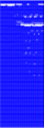

In [ ]:
import torch
from crp.concepts import ChannelConcept
import torchvision.transforms as T
from zennit.composites import EpsilonPlusFlat
from zennit.canonizers import SequentialMergeBatchNorm
from crp.attribution import CondAttribution
from crp.helper import get_layer_names
from crp.image import imgify
from crp.helper import get_layer_names
from crp.visualization import FeatureVisualization
import h5py
import matplotlib.pyplot as plt

# Assuming you have your PyTorch model stored in 'pytorch_model', load it here.
#model = pytorch_model
model.eval()

# Define the layer types you want to include in the layer names
layer_types = [torch.nn.Conv2d, torch.nn.Linear]  # Modify as needed

# Get a list of layer names in your model
layer_names = get_layer_names(model, layer_types)

# Print the layer names to find the correct one you want to condition on
print(layer_names)

# Load the logMelSpectrogram image.
with h5py.File("/content/gdrive/MyDrive/DATASET_AUDIO_PATTERN/testDatasetProva2.h5", "r") as fp:
    spectrograms = fp['logMelSpec'][5150]

# Define the desired shape for individual spectrograms
desired_shape = (1, 1, 128, 44)

# Reshape the spectrogram to the desired shape
spectrogram = spectrograms.reshape(desired_shape)

device = "cuda:0" if torch.cuda.is_available() else "cpu"
sample = torch.tensor(spectrogram).to(device)

composite = EpsilonPlusFlat([SequentialMergeBatchNorm()])
attribution = CondAttribution(model, no_param_grad=True)

# Compute heatmap for the spectrogram
conditions = [{"y": 0}]  # You can condition on specific classes if needed

# Convert sample to float
sample = sample.float()

# Now, continue with the rest of the code
sample.requires_grad = True
attr = attribution(sample, conditions, composite)

print(attr)

# Modify the following line with the class you want to condition on (e.g., class index 0):
desired_class = 2

# Modify the following line with the name of the layer you want to condition on (e.g., "Conv2d-1"):
desired_layer_name = "fc2"


# Compute heatmap of channel 35 in the specified layer conditioned on class output (adjust layer and class as needed)
conditions = [{"y": [desired_class], desired_layer_name: [128]}]
heatmap, _, _, _ = attribution(sample, conditions, composite)

# Print or visualize the heatmaps
print(torch.equal(attr[0], attr.heatmap))
imgify(attr.heatmap, symmetric=True)
imgify(heatmap, symmetric=True)




Processing layer base_model._blocks.15._project_conv
torch.Size([1, 320])
tensor([184,  88, 170, 129, 255,  42])
tensor([2.4698, 1.3972, 1.2511, 1.1413, 0.8498, 0.8038])



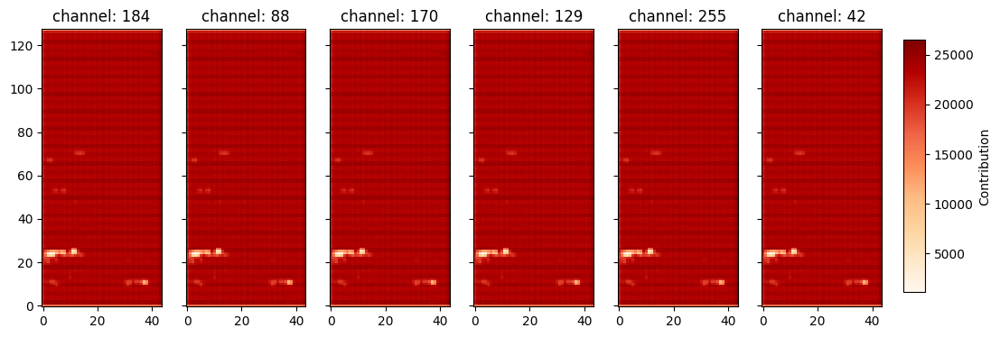


Processing layer base_model._conv_head
torch.Size([1, 1280])
tensor([ 128, 1170,  826,  332, 1022,  620])
tensor([2.4968, 1.8275, 1.8220, 1.1680, 1.1672, 1.0996])



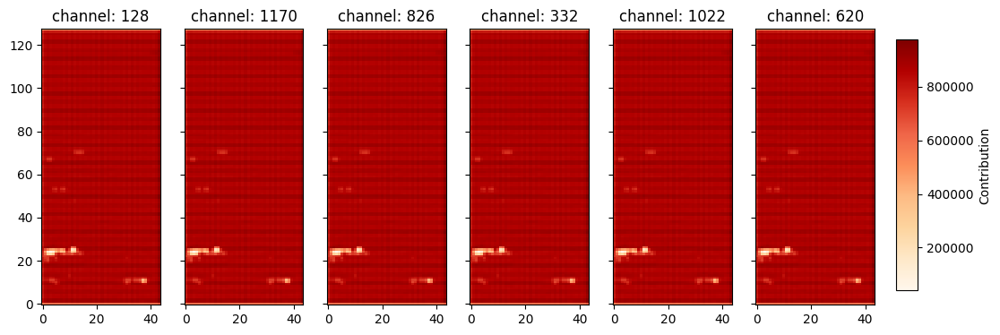


Processing layer fc1
torch.Size([1, 4096])
tensor([3547, 1916, 3185,  799, 3525,  391])
tensor([0.5548, 0.4509, 0.4284, 0.3891, 0.3536, 0.3402])



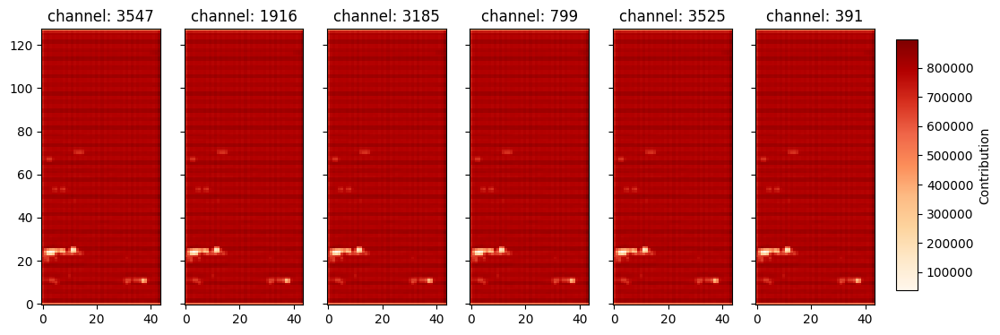


Processing layer fc2
torch.Size([1, 4096])
tensor([3229, 3680, 2864, 2382, 1394, 2213])
tensor([0.3691, 0.2911, 0.2817, 0.2773, 0.2730, 0.2672])



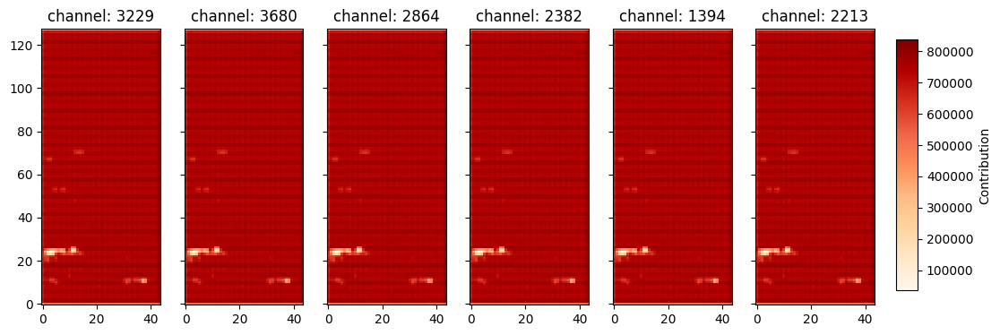

In [ ]:
from crp.concepts import ChannelConcept
from crp.helper import get_layer_names
from crp.visualization import FeatureVisualization
import h5py
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable

#representative spectrogram
#calori -> 7 -> conv8 -> freq. [mel -> 120, 65, 38, 42]
#presenza contemporanea -> 3607 -> conv8 -> freq.  [mel -> 119, 45, 44]
#Isolamento -> 5148 -> conv8 -> freq. [mel -> 118, 45]
#Separazione madre capretto -> 5619 -> conv -> freq. [mel. -> 44]



# Load the logMelSpectrogram image.
with h5py.File("/content/gdrive/MyDrive/DATASET_AUDIO_PATTERN/testDatasetProva2.h5", "r") as fp:
    spectrograms = fp['logMelSpec'][6259]

cc = ChannelConcept()

#set the class
classNumber = 4

#set the layer do you want to inspect
layerToProcess=['base_model._blocks.15._project_conv', 'base_model._conv_head', 'fc1', 'fc2']

for i in range(len(layerToProcess)):
  print("Processing layer " + str(layerToProcess[i]))

  # Define the desired shape for individual spectrograms
  desired_shape = (1, 1, 128, 44)

  # Reshape the spectrogram to the desired shape
  spectrogram = spectrograms.reshape(desired_shape)

  # Assuming you have your PyTorch model stored in 'pytorch_model', load it here.
  #model = pytorch_model
  model.eval()

  # Convert sample to float
  sample = torch.tensor(spectrogram, dtype=torch.float32, requires_grad=True)

  composite = EpsilonPlusFlat([SequentialMergeBatchNorm()])
  attribution = CondAttribution(model, no_param_grad=True)

  # Define the layer types you want to include in the layer names
  layer_types = [torch.nn.Conv2d, torch.nn.Linear]  # Modify as needed

  # Get a list of layer names in your model
  layer_names = get_layer_names(model, layer_types)

  #print(layer_names)

  conditions = [{'y': [classNumber]}]
  attr = attribution(sample, conditions, composite, record_layer=layer_names)

  # layer features.40 has 512 channel concepts
  rel_c = cc.attribute(attr.relevances[layerToProcess[i]], abs_norm=True)
  print(rel_c.shape)

  # the six most relevant concepts and their contribution to final classification in percent
  rel_values, concept_ids = torch.topk(rel_c[0], 6)
  concept_ids, rel_values*100

  print(concept_ids)
  print(rel_values*100)
  print("")

  conditions = [{layerToProcess[i]: [id], 'y': [classNumber]} for id in concept_ids]

  heatmap, _, _, _ = attribution(sample, conditions, composite)

  imgify(heatmap, cmap='wred', symmetric=False, grid=(1, len(concept_ids)), resize=780)

  # Assuming axs is an array of subplots
  fig, axs = plt.subplots(1, len(heatmap), figsize=(12, 4), sharey=True, gridspec_kw={'hspace': 0.5, 'wspace': 0.2})

  for i, slice_data in enumerate(heatmap):
      # Plot the original spectrogram with reduced opacity
      axs[i].imshow(spectrograms, cmap='viridis', aspect='auto', interpolation='none', alpha=1, origin="lower")

      #print(slice_data)

      # Overlay the heatmap with full opacity
      im = axs[i].imshow(slice_data, cmap='OrRd', aspect='auto', interpolation='none', alpha=1, origin="lower")

      # Overlay the heatmap with full opacity
      #im = axs[i].imshow(slice_data, cmap='Greys', aspect='auto', interpolation='none', alpha=0.6, origin="lower")
      axs[i].set_title(f'channel: {concept_ids[i]}')

  # Add colorbar to the right of the subplots
  cbar_ax = fig.add_axes([0.92, 0.15, 0.02, 0.7])  # [left, bottom, width, height]
  cbar = fig.colorbar(im, cax=cbar_ax, label='Contribution')

  plt.show()

  print("")

b'Fenomeni legati al parto'
7
Processing layer base_model._blocks.1._project_conv
torch.Size([1, 24])
Sum of values in the tensor: tensor(-57.2667)



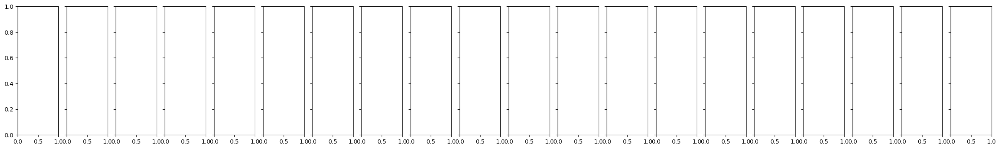

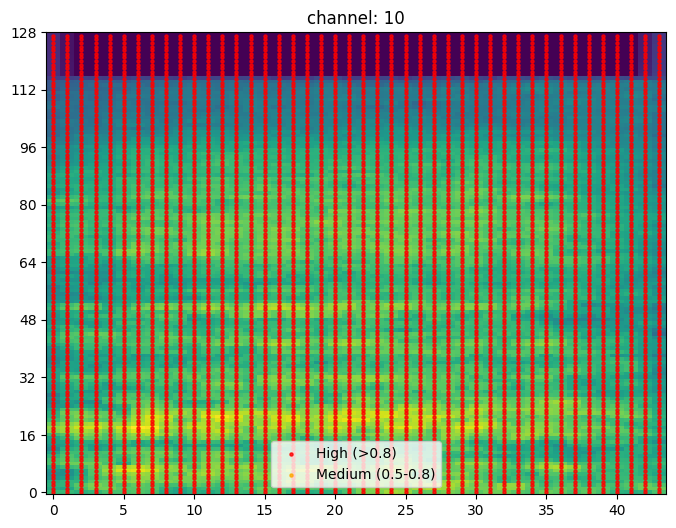

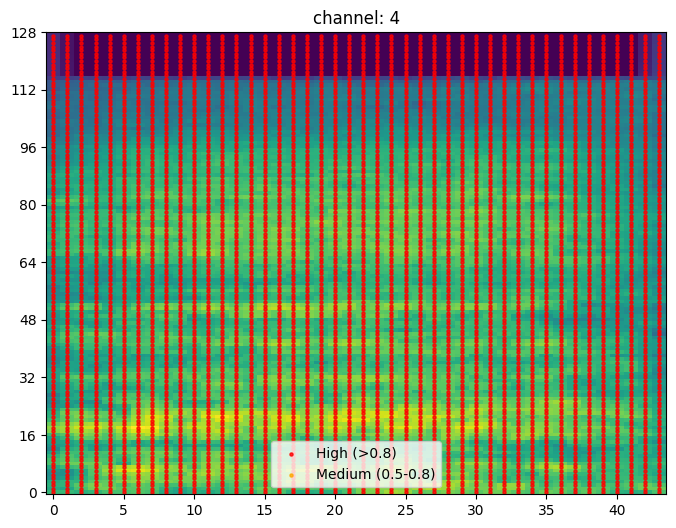

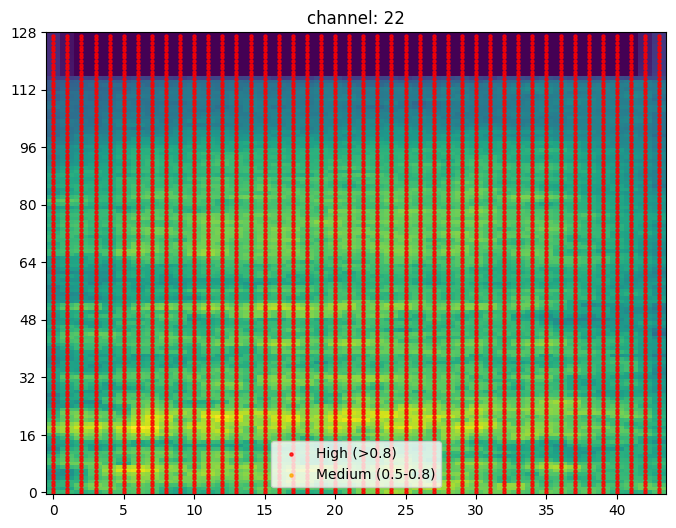

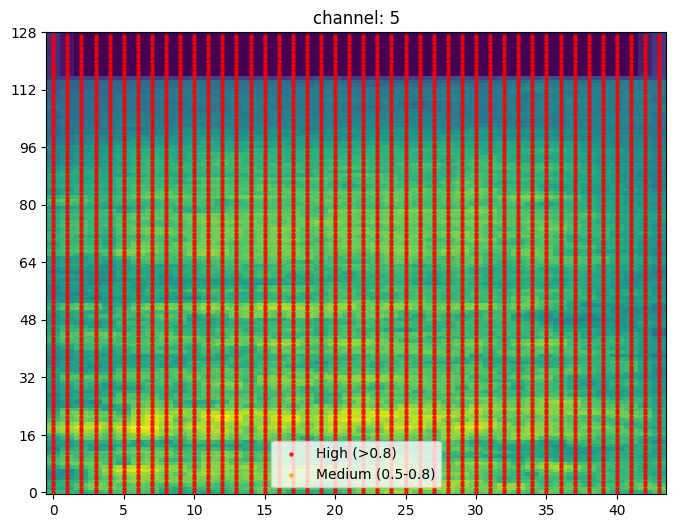

...

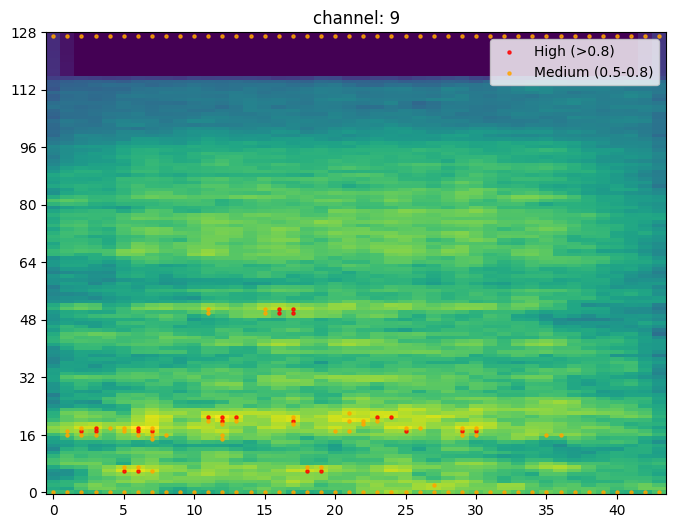

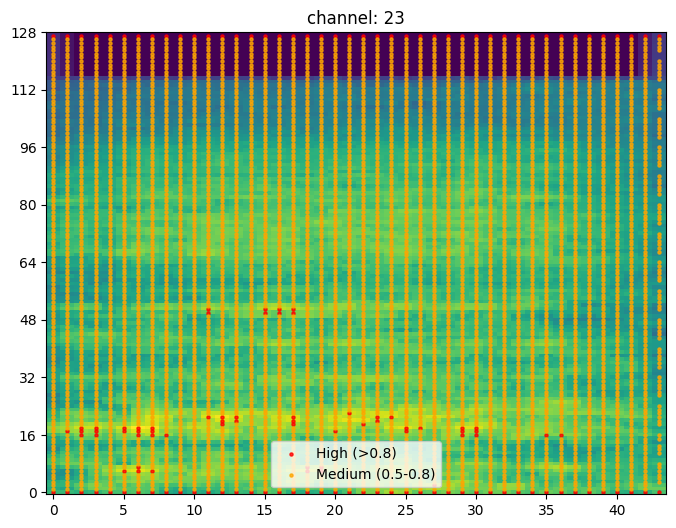

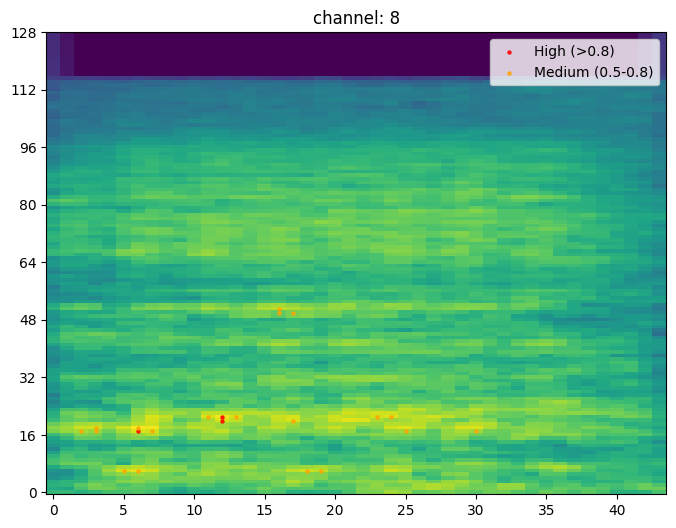

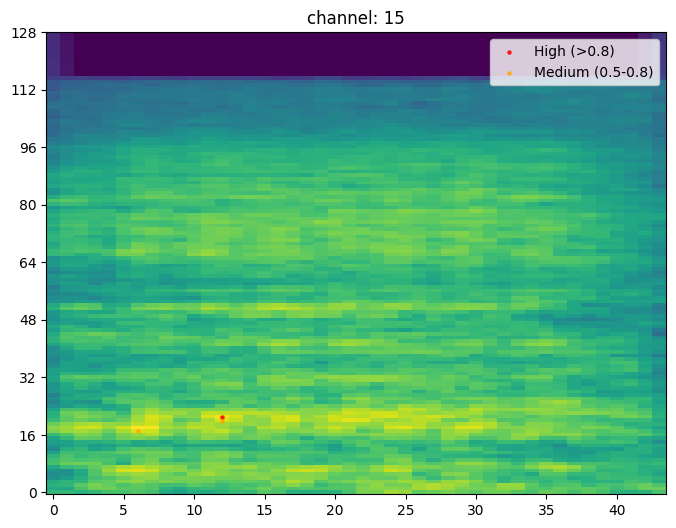

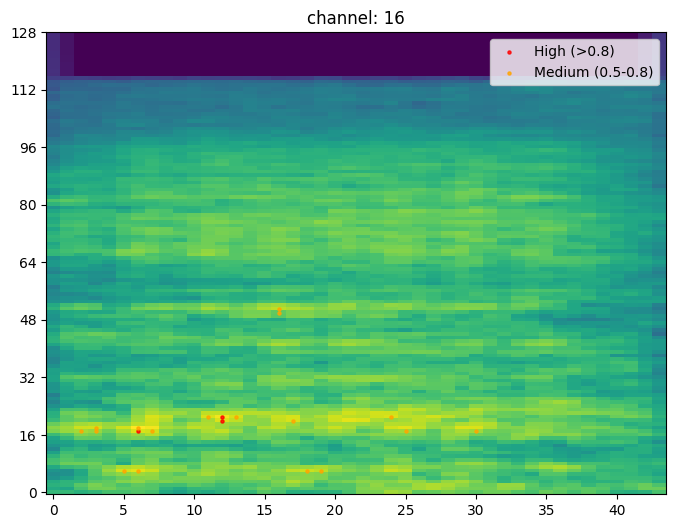


Processing layer base_model._blocks.5._project_conv
torch.Size([1, 80])
Sum of values in the tensor: tensor(-6.5532)



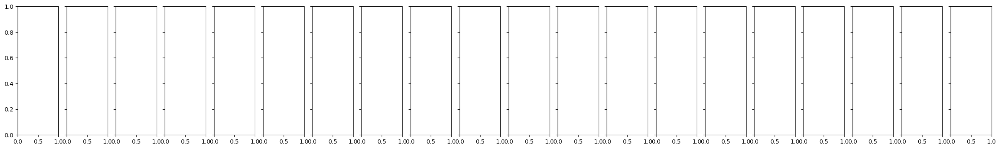

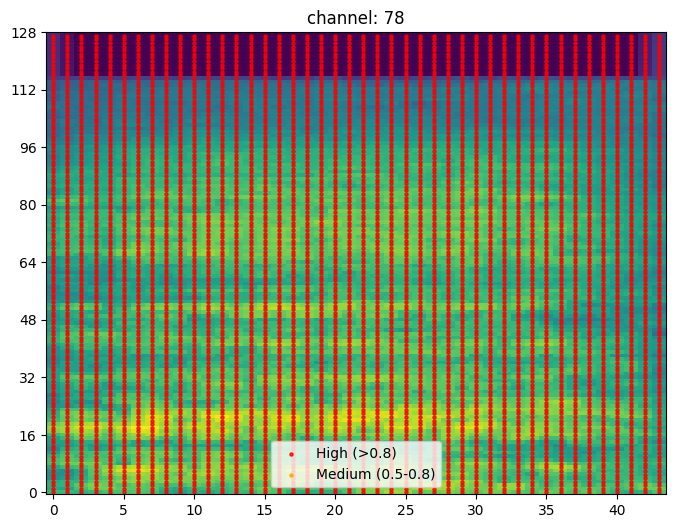

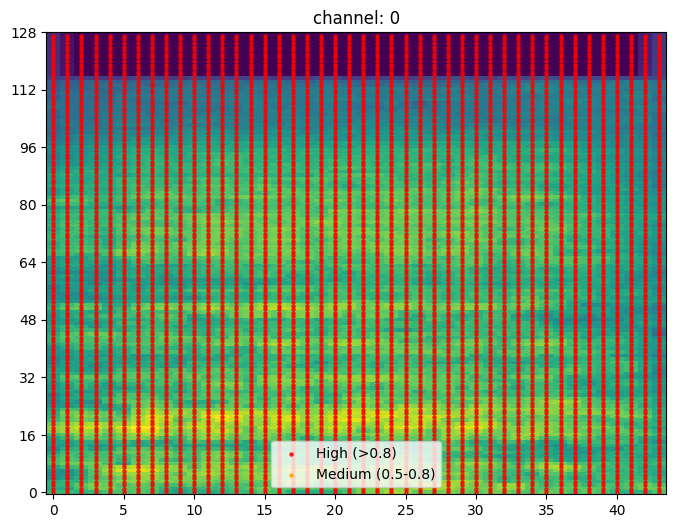

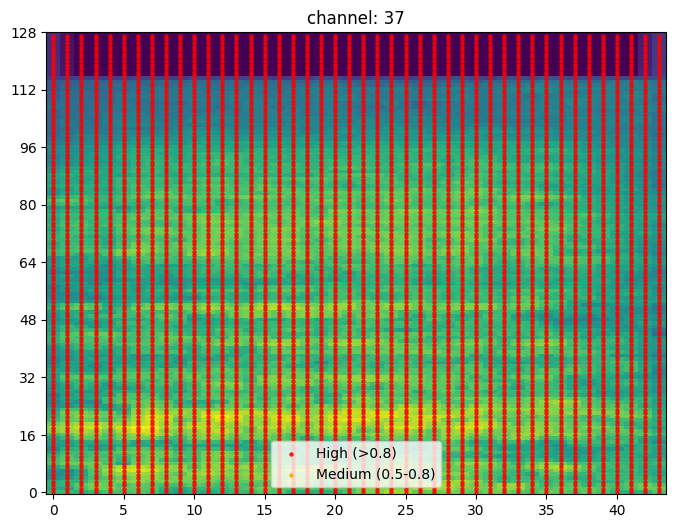

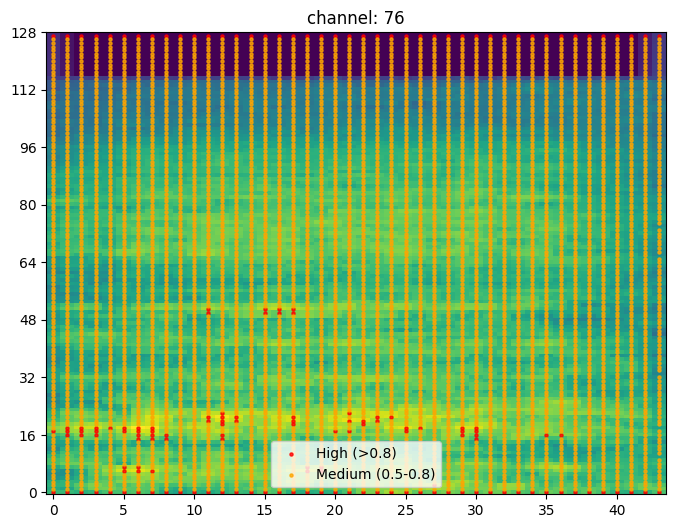

...

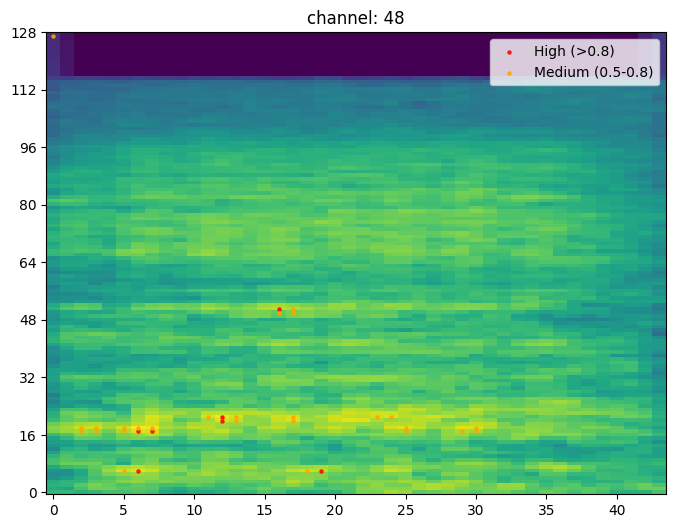

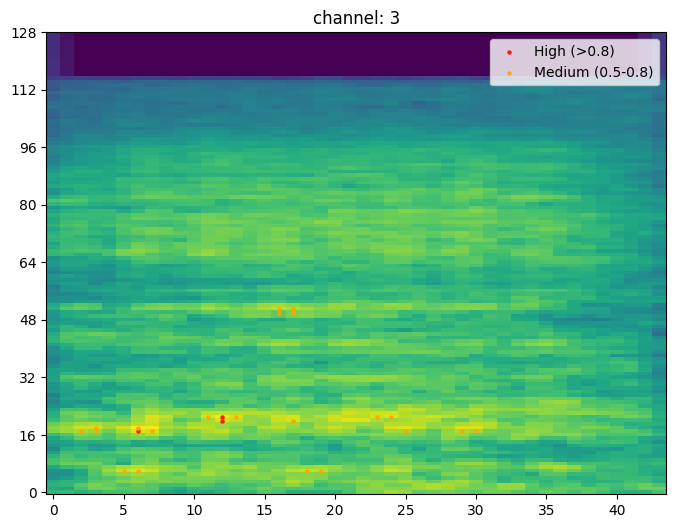

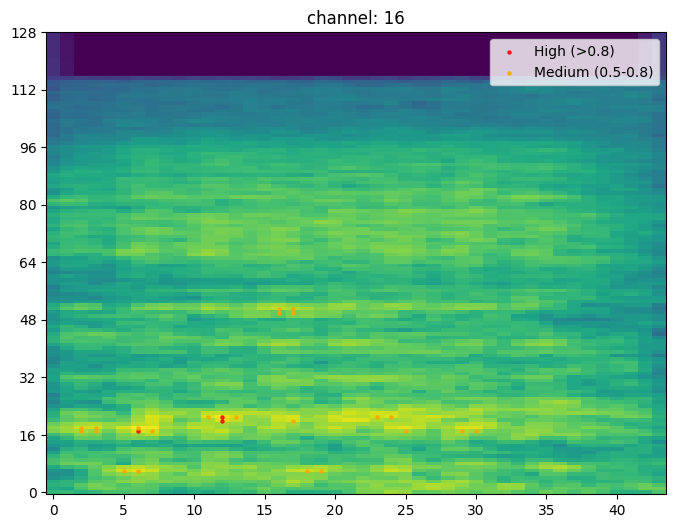

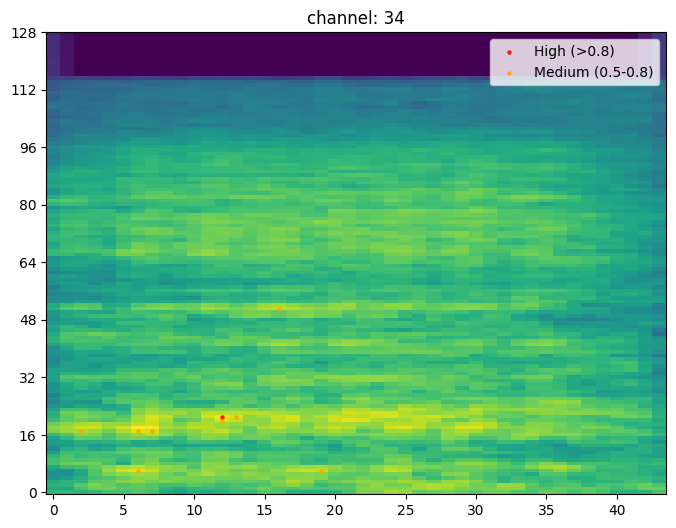

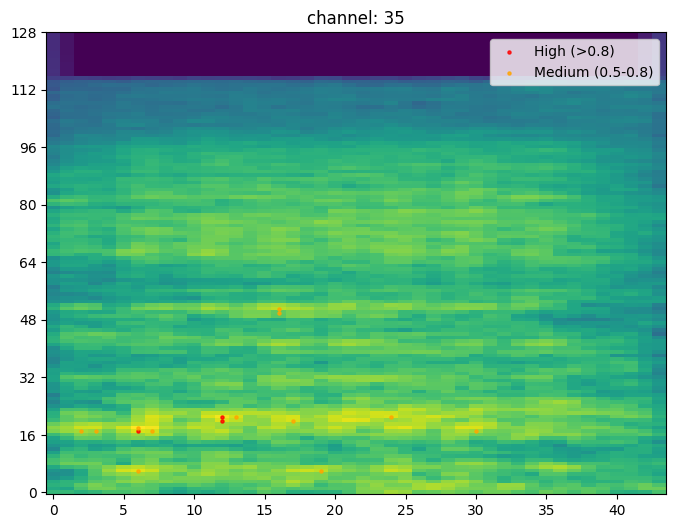


Processing layer base_model._blocks.15._project_conv
torch.Size([1, 320])
Sum of values in the tensor: tensor(7.9927)



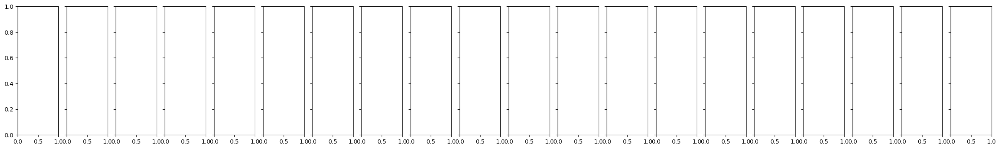

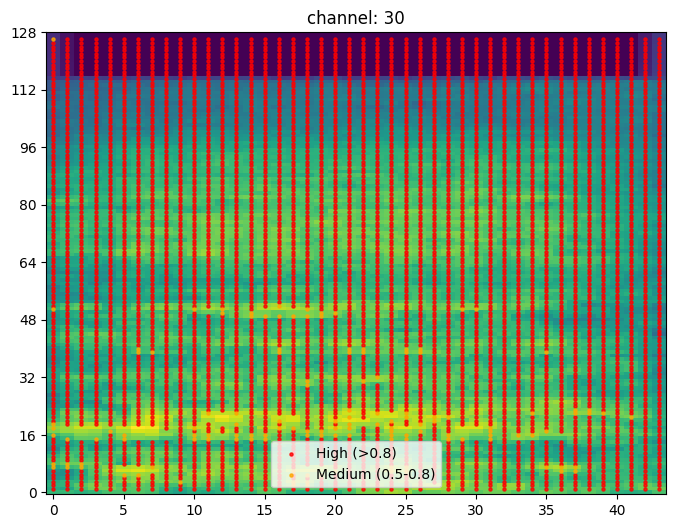


Processing layer base_model._conv_head
torch.Size([1, 1280])
Sum of values in the tensor: tensor(22.6537)



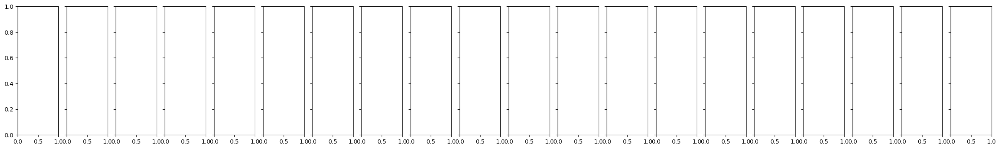

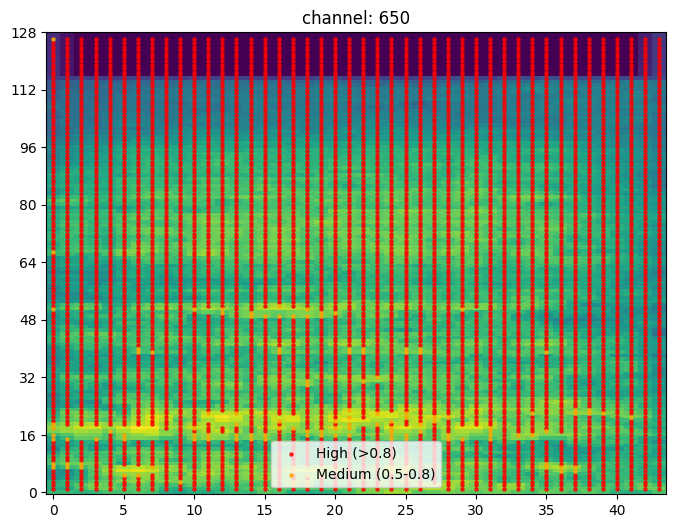


Processing layer fc1
torch.Size([1, 4096])
Sum of values in the tensor: tensor(6.1759)



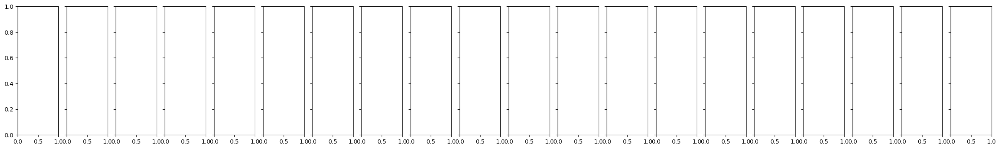

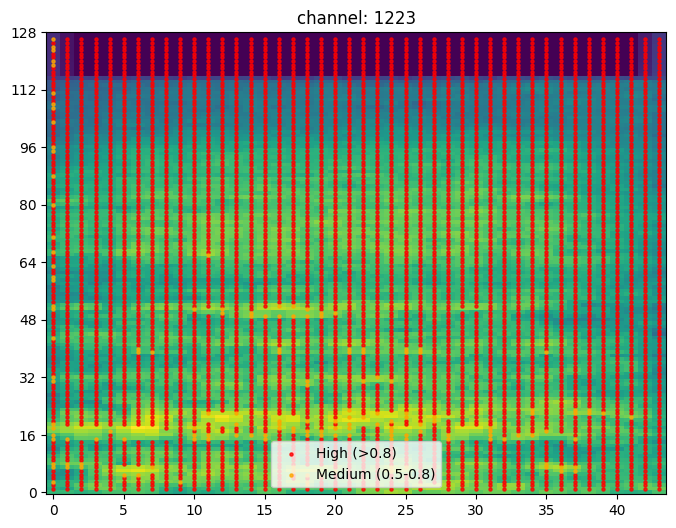

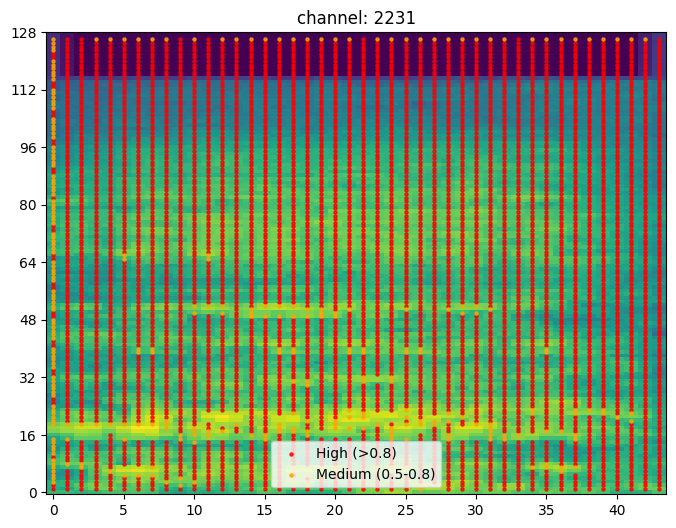

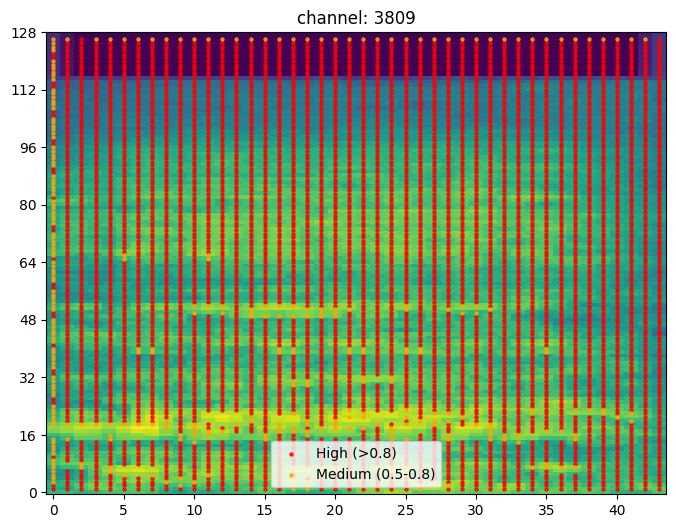


Processing layer fc2
torch.Size([1, 4096])
Sum of values in the tensor: tensor(4.8120)



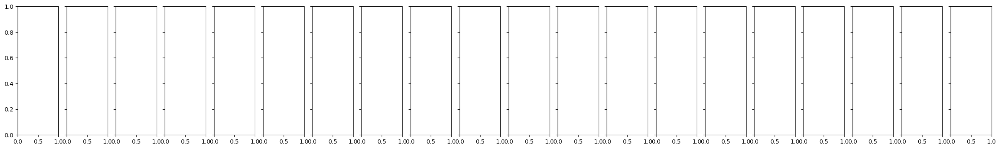

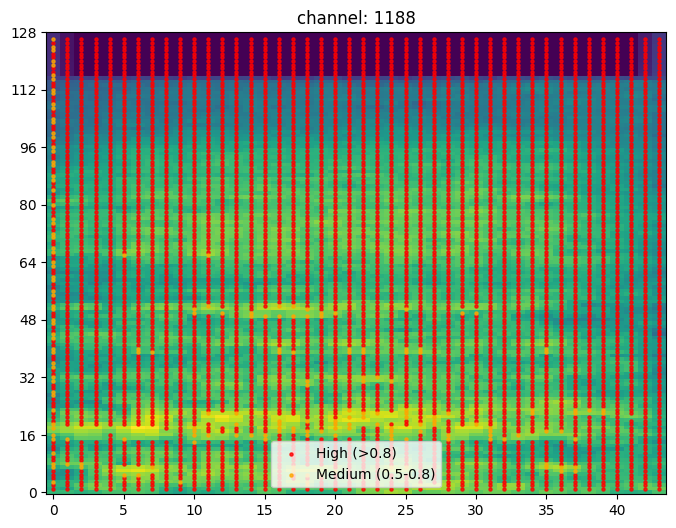

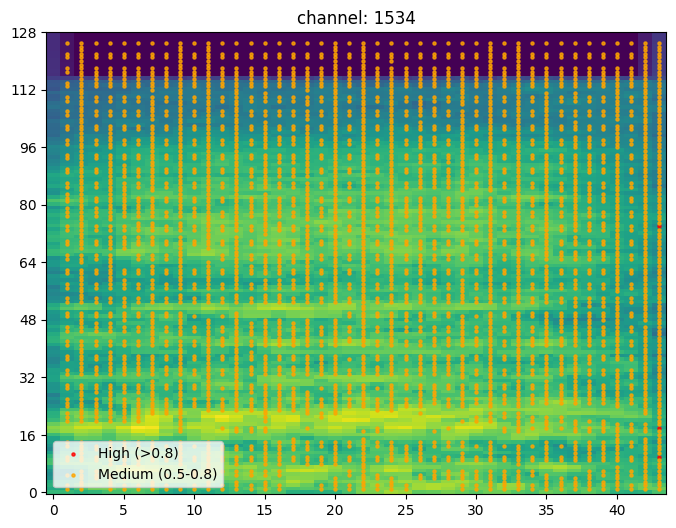

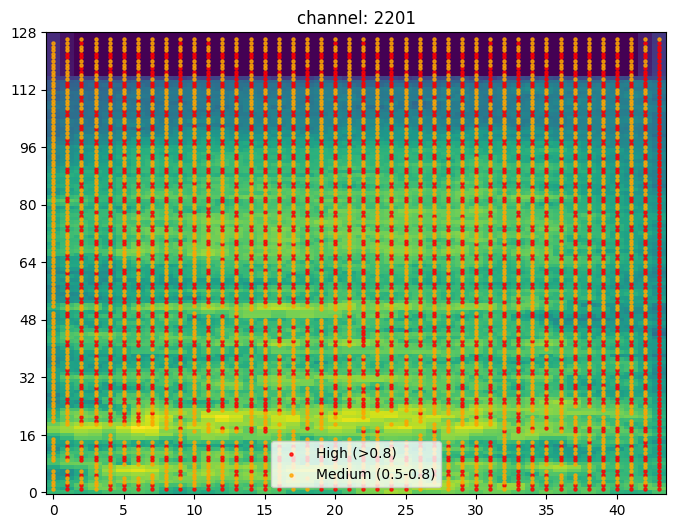

In [ ]:
from crp.concepts import ChannelConcept
from crp.helper import get_layer_names
from crp.visualization import FeatureVisualization
import h5py
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable

#representative spectrogram
#calori -> 7 -> conv8 -> freq. [mel -> 120, 65, 38, 42]
#presenza contemporanea -> 3607 -> conv8 -> freq.  [mel -> 119, 45, 44]
#Isolamento -> 5148 -> conv8 -> freq. [mel -> 118, 45]
#Separazione madre capretto -> 5619 -> conv -> freq. [mel. -> 44]

#0
#3605
#5148

#'base_model._conv_stem', 'base_model._blocks.0._depthwise_conv', 'base_model._blocks.0._se_reduce', 'base_model._blocks.0._se_expand', 'base_model._blocks.0._project_conv', 'base_model._blocks.1._expand_conv', 'base_model._blocks.1._depthwise_conv', 'base_model._blocks.1._se_reduce', 'base_model._blocks.1._se_expand', 'base_model._blocks.1._project_conv', 'base_model._blocks.2._expand_conv', 'base_model._blocks.2._depthwise_conv', 'base_model._blocks.2._se_reduce', 'base_model._blocks.2._se_expand', 'base_model._blocks.2._project_conv', 'base_model._blocks.3._expand_conv', 'base_model._blocks.3._depthwise_conv', 'base_model._blocks.3._se_reduce', 'base_model._blocks.3._se_expand', 'base_model._blocks.3._project_conv', 'base_model._blocks.4._expand_conv', 'base_model._blocks.4._depthwise_conv', 'base_model._blocks.4._se_reduce', 'base_model._blocks.4._se_expand', 'base_model._blocks.4._project_conv', 'base_model._blocks.5._expand_conv', 'base_model._blocks.5._depthwise_conv', 'base_model._blocks.5._se_reduce', 'base_model._blocks.5._se_expand', 'base_model._blocks.5._project_conv', 'base_model._blocks.6._expand_conv', 'base_model._blocks.6._depthwise_conv', 'base_model._blocks.6._se_reduce', 'base_model._blocks.6._se_expand', 'base_model._blocks.6._project_conv', 'base_model._blocks.7._expand_conv', 'base_model._blocks.7._depthwise_conv', 'base_model._blocks.7._se_reduce', 'base_model._blocks.7._se_expand', 'base_model._blocks.7._project_conv', 'base_model._blocks.8._expand_conv', 'base_model._blocks.8._depthwise_conv', 'base_model._blocks.8._se_reduce', 'base_model._blocks.8._se_expand', 'base_model._blocks.8._project_conv', 'base_model._blocks.9._expand_conv', 'base_model._blocks.9._depthwise_conv', 'base_model._blocks.9._se_reduce', 'base_model._blocks.9._se_expand', 'base_model._blocks.9._project_conv', 'base_model._blocks.10._expand_conv', 'base_model._blocks.10._depthwise_conv', 'base_model._blocks.10._se_reduce', 'base_model._blocks.10._se_expand', 'base_model._blocks.10._project_conv', 'base_model._blocks.11._expand_conv', 'base_model._blocks.11._depthwise_conv', 'base_model._blocks.11._se_reduce', 'base_model._blocks.11._se_expand', 'base_model._blocks.11._project_conv', 'base_model._blocks.12._expand_conv', 'base_model._blocks.12._depthwise_conv', 'base_model._blocks.12._se_reduce', 'base_model._blocks.12._se_expand', 'base_model._blocks.12._project_conv', 'base_model._blocks.13._expand_conv', 'base_model._blocks.13._depthwise_conv', 'base_model._blocks.13._se_reduce', 'base_model._blocks.13._se_expand', 'base_model._blocks.13._project_conv', 'base_model._blocks.14._expand_conv', 'base_model._blocks.14._depthwise_conv', 'base_model._blocks.14._se_reduce', 'base_model._blocks.14._se_expand', 'base_model._blocks.14._project_conv', 'base_model._blocks.15._expand_conv', 'base_model._blocks.15._depthwise_conv', 'base_model._blocks.15._se_reduce', 'base_model._blocks.15._se_expand', 'base_model._blocks.15._project_conv', 'base_model._conv_head', 'base_model._fc', 'fc1', 'fc2', 'fc3'


# Load the logMelSpectrogram image.
with h5py.File("/content/gdrive/MyDrive/DATASET_AUDIO_PATTERN/testDatasetProva2.h5", "r") as fp:
    spectrograms = fp['logMelSpec'][11063]
    label = fp['labels'][11063]
    mapping = fp['mapping'][label]

cc = ChannelConcept()

print(mapping)
print(label)

#set the class
classNumber = 7

#set the layer do you want to inspect
layerToProcess=['base_model._blocks.1._project_conv', 'base_model._blocks.5._project_conv', 'base_model._blocks.15._project_conv', 'base_model._conv_head', 'fc1', 'fc2']

for i in range(len(layerToProcess)):
  #number of filters to consider
  nIds = 0

  if layerToProcess[i] == "conv1":
    nIds = 64

  if layerToProcess[i] == "conv2":
    nIds = 64

  if layerToProcess[i] == "conv3":
    nIds = 128

  if layerToProcess[i] == "conv4":
    nIds = 128

  if layerToProcess[i] == "conv5":
    nIds = 256

  if layerToProcess[i] == "conv6":
    nIds = 256

  if layerToProcess[i] == "conv7":
    nIds = 512

  if layerToProcess[i] == "conv8":
    nIds = 512

  if layerToProcess[i] == "fc1":
    nIds = 4096

  if layerToProcess[i] == "fc2":
    nIds = 4096



  print("Processing layer " + str(layerToProcess[i]))

  # Define the desired shape for individual spectrograms
  desired_shape = (1, 1, 128, 44)

  # Reshape the spectrogram to the desired shape
  spectrogram = spectrograms.reshape(desired_shape)

  # Assuming you have your PyTorch model stored in 'pytorch_model', load it here.
  #model = pytorch_model
  model.eval()

  # Convert sample to float
  sample = torch.tensor(spectrogram, dtype=torch.float32, requires_grad=True)

  composite = EpsilonPlusFlat([SequentialMergeBatchNorm()])
  attribution = CondAttribution(model, no_param_grad=True)

  # Define the layer types you want to include in the layer names
  layer_types = [torch.nn.Conv2d, torch.nn.Linear]  # Modify as needed

  # Get a list of layer names in your model
  layer_names = get_layer_names(model, layer_types)

  #print(layer_names)

  conditions = [{'y': [classNumber]}]
  attr = attribution(sample, conditions, composite, record_layer=layer_names)

  # layer features.40 has 512 channel concepts
  rel_c = cc.attribute(attr.relevances[layerToProcess[i]], abs_norm=True)
  print(rel_c.shape)

  # the six most relevant concepts and their contribution to final classification in percent
  rel_values, concept_ids = torch.topk(rel_c[0], 20)
  concept_ids, rel_values*100

  #print(concept_ids)
  #print(rel_values*100)

  sum_rel_values = torch.sum(rel_values)
  print("Sum of values in the tensor:", sum_rel_values*100)

  print("")

  conditions = [{layerToProcess[i]: [id], 'y': [classNumber]} for id in concept_ids]

  heatmap, _, _, _ = attribution(sample, conditions, composite)

  imgify(heatmap, cmap='wred', symmetric=False, grid=(1, len(concept_ids)), resize=780)

  # Assuming axs is an array of subplots
  fig, axs = plt.subplots(1, len(heatmap), figsize=(30, 4), sharey=True, gridspec_kw={'hspace': 0.5, 'wspace': 0.2})

  threshold_high = 0.8
  threshold_medium = 0.7

  heatmap = np.array(heatmap)  # Convert to a NumPy array

  # Normalize the heatmap values
  normalized_heatmap = (heatmap - np.min(heatmap)) / (np.max(heatmap) - np.min(heatmap))


  for i, slice_data in enumerate(normalized_heatmap):
      # Find indices where relevance values exceed the thresholds
      high_value_indices_high = np.where(slice_data > threshold_high)
      high_value_indices_medium = np.where((slice_data <= threshold_high) & (slice_data > threshold_medium))

       # Get the x and y coordinates of high-value points for different thresholds
      x_coords_high, y_coords_high = high_value_indices_high
      x_coords_medium, y_coords_medium = high_value_indices_medium

      #print("high coordinates: " + " " + str(x_coords_high))

      if len(x_coords_high) != 0:
        fig, ax = plt.subplots(figsize=(8, 6))  # Adjust size as needed
        ax.imshow(spectrograms, cmap='viridis', aspect='auto', interpolation='none', alpha=1, origin="lower")
        ax.scatter(y_coords_high, x_coords_high, color='red', s=5, alpha=0.8, label='High (>0.8)')
        ax.scatter(y_coords_medium, x_coords_medium, color='orange', s=5, alpha=0.8, label='Medium (0.5-0.8)')
        ax.set_title(f'channel: {concept_ids[i]}')
        ax.set_yticks(np.arange(0, 129, 16))
        ax.set_yticklabels(np.arange(0, 129, 16))
        ax.legend()
        plt.show()


  print("")



spectrogram 0
b'Fenomeni legati al parto'
7
spectrogram in processing... 0
Processing layer base_model._blocks.15._project_conv
torch.Size([1, 320])
Sum of values in the tensor: tensor(1.9743)

spectrogram in processing... 0
Processing layer fc1
torch.Size([1, 4096])
Sum of values in the tensor: tensor(1.8842)

spectrogram in processing... 0
Processing layer fc2
torch.Size([1, 4096])
Sum of values in the tensor: tensor(1.5703)

spectrogram 1
b'Fenomeni legati al parto'
7
spectrogram in processing... 1
Processing layer base_model._blocks.15._project_conv
torch.Size([1, 320])
Sum of values in the tensor: tensor(4.1206)

spectrogram in processing... 1
Processing layer fc1
torch.Size([1, 4096])
Sum of values in the tensor: tensor(2.1569)

spectrogram in processing... 1
Processing layer fc2
torch.Size([1, 4096])
Sum of values in the tensor: tensor(1.5563)

spectrogram 2
b'Fenomeni legati al parto'
7
spectrogram in processing... 2
Processing layer base_model._blocks.15._project_conv
torch.Si

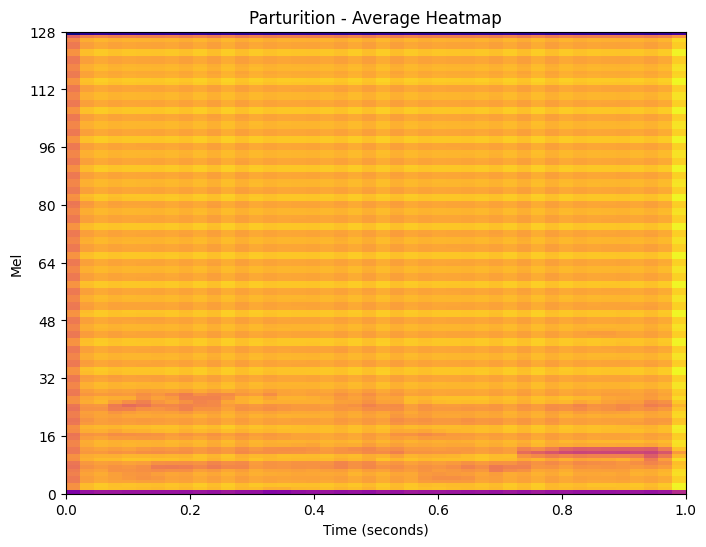

In [ ]:
from crp.concepts import ChannelConcept
from crp.helper import get_layer_names
from crp.visualization import FeatureVisualization
import h5py
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable

#representative spectrogram
#calori -> 7 -> conv8 -> freq. [mel -> 120, 65, 38, 42]
#presenza contemporanea -> 3607 -> conv8 -> freq.  [mel -> 119, 45, 44]
#Isolamento -> 5148 -> conv8 -> freq. [mel -> 118, 45]
#Separazione madre capretto -> 5619 -> conv -> freq. [mel. -> 44]

#0
#3605
#5148

heatmaps_for_average = []

for index in range(100):
  print("spectrogram " + str(index))
  #process a spectrogram
  with h5py.File("/content/gdrive/MyDrive/DATASET_AUDIO_PATTERN/testDatasetProva2.h5", "r") as fp:
    spectrograms = fp['logMelSpec'][index + 11062]
    label = fp['labels'][index + 11062]
    mapping = fp['mapping'][label]

  cc = ChannelConcept()

  print(mapping)
  print(label)

  #set the class
  classNumber = 7

  #set the layer do you want to inspect
  layerToProcess=['base_model._blocks.15._project_conv', 'fc1', 'fc2']

  for i in range(len(layerToProcess)):

    print("spectrogram in processing... " + str(index))

    print("Processing layer " + str(layerToProcess[i]))

    # Define the desired shape for individual spectrograms
    desired_shape = (1, 1, 128, 44)

    # Reshape the spectrogram to the desired shape
    spectrogram = spectrograms.reshape(desired_shape)

    model.eval()

    # Convert sample to float
    sample = torch.tensor(spectrogram, dtype=torch.float32, requires_grad=True)

    composite = EpsilonPlusFlat([SequentialMergeBatchNorm()])
    attribution = CondAttribution(model, no_param_grad=True)

    # Define the layer types you want to include in the layer names
    layer_types = [torch.nn.Conv2d, torch.nn.Linear]  # Modify as needed

    # Get a list of layer names in your model
    layer_names = get_layer_names(model, layer_types)

    #print(layer_names)

    conditions = [{'y': [classNumber]}]
    attr = attribution(sample, conditions, composite, record_layer=layer_names)

    # layer features.40 has 512 channel concepts
    rel_c = cc.attribute(attr.relevances[layerToProcess[i]], abs_norm=True)
    print(rel_c.shape)

    # the six most relevant concepts and their contribution to final classification in percent
    rel_values, concept_ids = torch.topk(rel_c[0], 5)
    concept_ids, rel_values*100

    sum_rel_values = torch.sum(rel_values)
    print("Sum of values in the tensor:", sum_rel_values*100)

    print("")

    conditions = [{layerToProcess[i]: [id], 'y': [classNumber]} for id in concept_ids]

    heatmap, _, _, _ = attribution(sample, conditions, composite)

    heatmaps_for_average.append(heatmap)



# Compute the average across all heatmaps along the 0-th dimension
all_heatmaps = torch.cat(heatmaps_for_average, dim=0)
average_heatmap = torch.mean(all_heatmaps, dim=0)

# Reshape the average heatmap to add a new dimension
average_heatmap = average_heatmap.unsqueeze(2)  # Unsqueezing along the second axis

print("Shape of the adjusted average heatmap:", average_heatmap.shape)

# Convert PyTorch tensor to NumPy array for plotting
average_heatmap_np = average_heatmap.squeeze().numpy()

plt.figure(figsize=(8, 6))
im = plt.imshow(average_heatmap_np, cmap='plasma', aspect='auto', interpolation='none', origin='lower', extent=[0, 1, 0, 128])
plt.title('Parturition - Average Heatmap')
plt.xlabel('Time (seconds)')
plt.ylabel('Mel')


plt.yticks(np.arange(0, 129, 16), np.arange(0, 129, 16))  # Set y-axis ticks and labels
plt.show()





#**CUSTOM_CNN -> TEST PREDICTION**

In [ ]:
import numpy as np
import os
import librosa
import h5py

DATASET_PATH = '/content/gdrive/MyDrive/DATASET_AUDIO_PATTERN/Dataset_V2_official_classes'
hdf5_path = "/content/gdrive/MyDrive/DATASET_AUDIO_PATTERN/testDatasetProva2.h5"


DATASET_DIRECTORIES = [
    "/content/gdrive/MyDrive/DATASET_AUDIO_PATTERN/Dataset_V2_official_classes/Calori",
    "/content/gdrive/MyDrive/DATASET_AUDIO_PATTERN/Dataset_V2_official_classes/Presenza contemporanea di madri e capretti",
    "/content/gdrive/MyDrive/DATASET_AUDIO_PATTERN/Dataset_V2_official_classes/Isolamento sociale",
    "/content/gdrive/MyDrive/DATASET_AUDIO_PATTERN/Dataset_V2_official_classes/Separazione madre capretto",
    "/content/gdrive/MyDrive/DATASET_AUDIO_PATTERN/Dataset_V2_official_classes/Visita di estranei",
    "/content/gdrive/MyDrive/DATASET_AUDIO_PATTERN/Dataset_V2_official_classes/Distribuzione Cibo",
    "/content/gdrive/MyDrive/DATASET_AUDIO_PATTERN/Dataset_V2_official_classes/Ferita-Morte",
    "/content/gdrive/MyDrive/DATASET_AUDIO_PATTERN/Dataset_V2_official_classes/Fenomeni legati al parto",
]

SAMPLE_RATE = 22050
DURATION = 2 #seconds
SAMPLES_PER_TRACK = SAMPLE_RATE * DURATION

n_mels = 128
hop_length = 512
n_fft = 2048

# data augmentation parameters
time_stretch_rates=[1.0]
pitch_shift_steps=[0]

# Define the desired order of classes
desired_class_order = [
    'Calori',
    'Presenza contemporanea di madri e capretti' ,
    'Isolamento sociale',
    'Separazione madre capretto' ,
    'Visita di estranei',
    'Distribuzione Cibo' ,
    'Ferita-Morte',
    'Fenomeni legati al parto'
]

# Create the mapping list based on the desired order
mapping = desired_class_order

# performing tiime stretching and pitch shifting - Data Augmentation
def augment_data(signal, sr, time_stretch_rates, pitch_shift_steps):
  augmented_data = []
  for ts_rate in time_stretch_rates:
      ts_signal = librosa.effects.time_stretch(signal, rate=ts_rate)
      for ps_step in pitch_shift_steps:
          ps_signal = librosa.effects.pitch_shift(ts_signal, sr=sr, n_steps=ps_step)
          augmented_data.append(ps_signal)
  return augmented_data

def save_logMel_dataset(dataset_paths, n_mels=n_mels, n_fft=2048, hop_length=hop_length, num_segments=2, overlap=0.5):
    data = {
        "mapping": [],
        "logMelSpec": [],
        "labels": []
    }

    samples_per_segment = int(SAMPLES_PER_TRACK / num_segments)
    frame_length = samples_per_segment
    frame_shift = int(frame_length * overlap)

    for i, dataset_path in enumerate(dataset_paths):
        # Use the manually defined mapping
        data["mapping"].append(mapping[i])
        print("\nProcessing {}".format(mapping[i]))

        for dirpath, _, filenames in os.walk(dataset_path):
            for f in filenames:
                # Load audio file
                file_path = os.path.join(dirpath, f)
                signal, sr = librosa.load(file_path, sr=SAMPLE_RATE)

                # Augment data
                augmented_data = augment_data(signal, sr, time_stretch_rates, pitch_shift_steps)

                for aug_signal in augmented_data:
                    frames = librosa.util.frame(aug_signal, frame_length=frame_length, hop_length=frame_shift).T
                    for frame in frames:
                        S = librosa.feature.melspectrogram(y=frame, sr=sr, n_mels=n_mels, hop_length=hop_length, n_fft=n_fft)
                        log_S = librosa.power_to_db(S, ref=np.max)
                        data["logMelSpec"].append(log_S.tolist())
                        data["labels"].append(i)
                        print(i)
                        print(mapping[i])

    with h5py.File(hdf5_path, 'w') as f:
        f.create_dataset("mapping", data=np.array(data["mapping"], dtype='S'))
        f.create_dataset("logMelSpec", data=np.array(data["logMelSpec"]))
        f.create_dataset("labels", data=np.array(data["labels"]))


if __name__ == "__main__":
    save_logMel_dataset(DATASET_DIRECTORIES, num_segments=2, overlap=0.5)


Output streaming troncato alle ultime 5000 righe.
5
Distribuzione Cibo
5
Distribuzione Cibo
5
Distribuzione Cibo
5
Distribuzione Cibo
5
Distribuzione Cibo
5
Distribuzione Cibo
5
Distribuzione Cibo
5
Distribuzione Cibo
5
Distribuzione Cibo
5
Distribuzione Cibo
5
Distribuzione Cibo
5
Distribuzione Cibo
5
Distribuzione Cibo
5
Distribuzione Cibo
5
Distribuzione Cibo
5
Distribuzione Cibo
5
Distribuzione Cibo
5
Distribuzione Cibo
5
Distribuzione Cibo
5
Distribuzione Cibo
5
Distribuzione Cibo
5
Distribuzione Cibo
5
Distribuzione Cibo
5
Distribuzione Cibo
5
Distribuzione Cibo
5
Distribuzione Cibo
5
Distribuzione Cibo
5
Distribuzione Cibo
5
Distribuzione Cibo
5
Distribuzione Cibo
5
Distribuzione Cibo
5
Distribuzione Cibo
5
Distribuzione Cibo
5
Distribuzione Cibo
5
Distribuzione Cibo
5
Distribuzione Cibo
5
Distribuzione Cibo
5
Distribuzione Cibo
5
Distribuzione Cibo
5
Distribuzione Cibo
5
Distribuzione Cibo
5
Distribuzione Cibo
5
Distribuzione Cibo
5
Distribuzione Cibo
5
Distribuzione Cibo
5
Dis

In [ ]:
import h5py
import numpy as np
import tensorflow as tf
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Define the path to the saved model directory
saved_model_path = '/content/gdrive/MyDrive/DATASET_AUDIO_PATTERN/customCNN_vocapra_model'

# Load your saved model
loaded_model = tf.saved_model.load(saved_model_path)

# Load your test data from the HDF5 file
test_dataset = "/content/gdrive/MyDrive/DATASET_AUDIO_PATTERN/testDatasetProva2.h5"
train_dataset = "/content/gdrive/MyDrive/DATASET_AUDIO_PATTERN/data_custom_CNN.h5"

with h5py.File(test_dataset, 'r') as h5_file:
    spectrograms = h5_file['logMelSpec'][:]
    labels = h5_file['labels'][:]
    mappingTEST = h5_file['mapping'][:]
    # Remove this line to keep the mapping from the training dataset
    # mapping = h5_file['mapping'][:]

with h5py.File(train_dataset, 'r') as h5_file:
    mappingTRAIN = h5_file['mapping'][:]

print(mappingTEST)
print(mappingTRAIN)

[b'Calori' b'Presenza contemporanea di madri e capretti'
 b'Isolamento sociale' b'Separazione madre capretto' b'Visita di estranei'
 b'Distribuzione Cibo' b'Ferita-Morte' b'Fenomeni legati al parto']
[b'Calori' b'Presenza contemporanea di madri e capretti'
 b'Isolamento sociale' b'Separazione madre capretto' b'Visita di estranei'
 b'Distribuzione Cibo' b'Ferita-Morte' b'Fenomeni legati al parto']


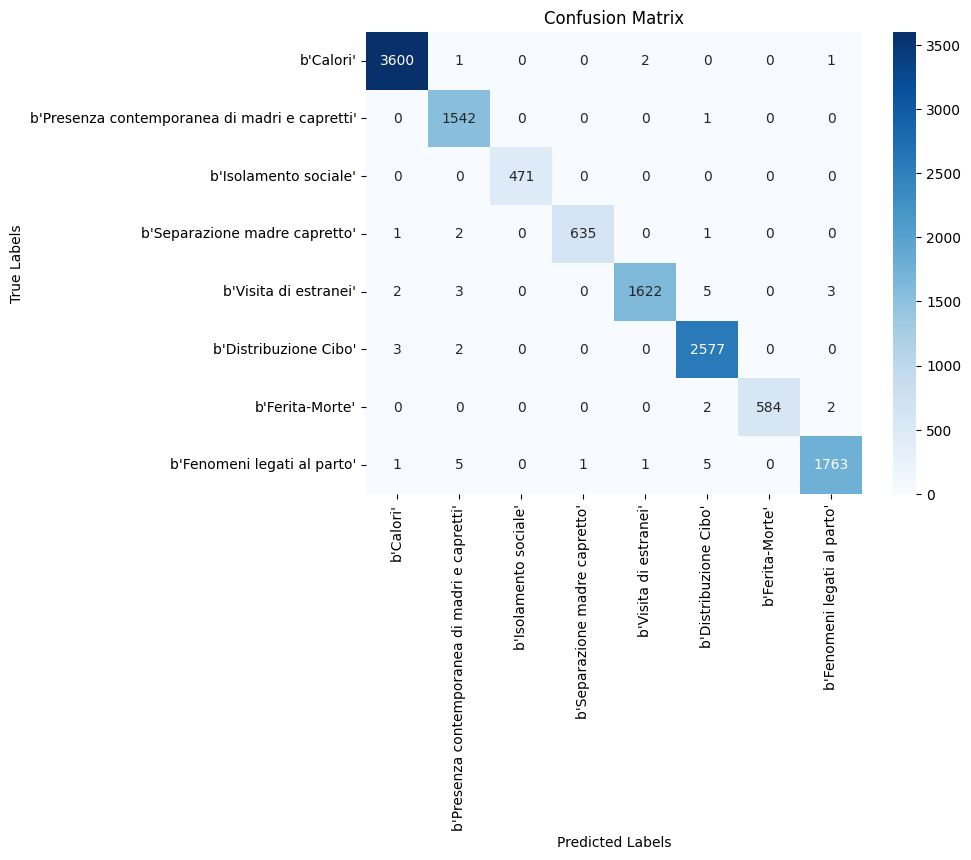

{0: {'true_indices': [0, 0, 1, 2, 3], 'true_spectrograms': [array([[[[-28.271086],
         [-25.613537],
         [-25.444647],
         ...,
         [-31.893581],
         [-26.58411 ],
         [-25.223663]],

        [[-27.738276],
         [-23.64003 ],
         [-23.147364],
         ...,
         [-24.358341],
         [-23.747604],
         [-22.911146]],

        [[-33.51766 ],
         [-30.080826],
         [-30.600178],
         ...,
         [-22.408434],
         [-23.354828],
         [-23.584246]],

        ...,

        [[-62.2806  ],
         [-68.32583 ],
         [-80.      ],
         ...,
         [-80.      ],
         [-64.509514],
         [-57.577076]],

        [[-62.339737],
         [-68.38429 ],
         [-80.      ],
         ...,
         [-80.      ],
         [-64.57665 ],
         [-57.64416 ]],

        [[-62.376717],
         [-68.42086 ],
         [-80.      ],
         ...,
         [-80.      ],
         [-64.62033 ],
         [-57.68781 ]]]], d

In [ ]:
import h5py
import numpy as np
import tensorflow as tf
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Define the path to the saved model directory
saved_model_path = '/content/gdrive/MyDrive/DATASET_AUDIO_PATTERN/customCNN_vocapra_model'

# Load your saved model
loaded_model = tf.saved_model.load(saved_model_path)

# Load your test data from the HDF5 file
test_dataset = "/content/gdrive/MyDrive/DATASET_AUDIO_PATTERN/testDatasetProva2.h5"
train_dataset = "/content/gdrive/MyDrive/DATASET_AUDIO_PATTERN/data_custom_CNN.h5"

with h5py.File(test_dataset, 'r') as h5_file:
    spectrograms = h5_file['logMelSpec'][:]
    labels = h5_file['labels'][:]
    mapping = h5_file['mapping'][:]
    # Remove this line to keep the mapping from the training dataset
    # mapping = h5_file['mapping'][:]

with h5py.File(train_dataset, 'r') as h5_file:
    mappingTrainigDataset = h5_file['mapping'][:]




"""
[b'Calori' b'Distribuzione Cibo' b'Isolamento sociale'
 b'Visita di estranei' b'Fenomeni legati al parto'
 b'Presenza contemporanea di madri e capretti' b'Ferita-Morte'
 b'Separazione madre capretto']

# Define the training dataset's mapping
train_mapping = ['b\'Calori\'', 'b\'Presenza contemporanea di madri e capretti\'', 'b\'Isolamento sociale\'',
                 'b\'Separazione madre capretto\'', 'b\'Visita di estranei\'', 'b\'Distribuzione cibo\'',
                 'b\'Ferita-Morte\'', 'b\'Fenomeni legati al parto\'']
"""

predicted_labels = []
true_labels = []

# Create a dictionary to store the correctly and incorrectly predicted spectrograms for each class
saved_data = {}

# Iterate through each spectrogram and obtain predictions
for i, (spectrogram, label) in enumerate(zip(spectrograms, labels)):
    # Add an extra dimension for the batch size and convert to float
    spectrogram = spectrogram.reshape((1, 128, 44, 1)).astype('float32')

    # Make predictions using the loaded model
    predictions = loaded_model(spectrogram)

    # Get the predicted label (assuming it's a single class)
    predicted_label = np.argmax(predictions)

     # Append the predicted and true labels to their respective lists
    predicted_labels.append(predicted_label)
    true_labels.append(label)

    if predicted_label == label and label not in saved_data:
        # This spectrogram is correctly predicted
        saved_data[label] = {
            'true_indices': [i],
            'true_spectrograms': [spectrogram]
        }
    elif predicted_label != label and label not in saved_data:
        # This spectrogram is incorrectly predicted
        saved_data[label] = {
            'true_indices': [],
            'true_spectrograms': []
        }

    if predicted_label == label and len(saved_data[label]['true_indices']) < 5:
        saved_data[label]['true_indices'].append(i)
        saved_data[label]['true_spectrograms'].append(spectrogram)
    elif predicted_label != label:
        # This spectrogram is incorrectly predicted
        saved_data[label]['false_index'] = i
        saved_data[label]['false_spectrogram'] = spectrogram


# Create a confusion matrix
confusion_matrix_result = confusion_matrix(true_labels, predicted_labels)


# Visualize the confusion matrix using a heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(confusion_matrix_result, annot=True, fmt="d", cmap="Blues", xticklabels=mapping, yticklabels=mapping)
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')
plt.show()

print(saved_data)




In [ ]:
for class_label, class_data in saved_data.items():
    print(f"Class Label: {class_label}")
    print("Correctly Predicted Spectrograms:")
    for i, spectrogram in enumerate(class_data['true_spectrograms']):
        print(f"Correct Prediction {i+1}: Index {class_data['true_indices'][i]}")
    if 'false_index' in class_data:
        print(f"Incorrectly Predicted Spectrogram: Index {class_data['false_index']}")
    print()


Class Label: 0
Correctly Predicted Spectrograms:
Correct Prediction 1: Index 0
Correct Prediction 2: Index 0
Correct Prediction 3: Index 1
Correct Prediction 4: Index 2
Correct Prediction 5: Index 3
Incorrectly Predicted Spectrogram: Index 3012

Class Label: 1
Correctly Predicted Spectrograms:
Correct Prediction 1: Index 3604
Correct Prediction 2: Index 3604
Correct Prediction 3: Index 3605
Correct Prediction 4: Index 3606
Correct Prediction 5: Index 3607
Incorrectly Predicted Spectrogram: Index 3632

Class Label: 2
Correctly Predicted Spectrograms:
Correct Prediction 1: Index 5147
Correct Prediction 2: Index 5147
Correct Prediction 3: Index 5148
Correct Prediction 4: Index 5149
Correct Prediction 5: Index 5150

Class Label: 3
Correctly Predicted Spectrograms:
Correct Prediction 1: Index 5618
Correct Prediction 2: Index 5618
Correct Prediction 3: Index 5619
Correct Prediction 4: Index 5620
Correct Prediction 5: Index 5621
Incorrectly Predicted Spectrogram: Index 6183

Class Label: 4
Co